# Importing Libraries

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
from pandas_profiling import ProfileReport

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Loading Dataset

In [2]:
df = pd.read_csv("Anomaly Data Set[888].csv")
df

,date_,google_pay,others,paytm,phonepe
0,2022-05-07 00:15:00,0.0,0.0,3.0,0.0
1,2022-05-07 00:30:00,0.0,5.0,2.0,5.0
2,2022-05-07 00:45:00,9.0,2.0,3.0,4.0
3,2022-05-07 01:00:00,23.0,5.0,13.0,26.0
4,2022-05-07 01:15:00,30.0,13.0,15.0,56.0
...,...,...,...,...,...
2303,2022-06-06 06:45:00,4717.0,1316.0,1864.0,3471.0
2304,2022-06-06 07:00:00,4553.0,1237.0,1860.0,3289.0
2305,2022-06-06 07:15:00,4463.0,1206.0,1745.0,3171.0
2306,2022-06-06 07:30:00,4562.0,1179.0,1733.0,3143.0


In [3]:
# Transforming the date_ column from 'object' type to 'datetime' format

df['date_'] = pd.to_datetime(df['date_'])

# Generating Profile Report for Dataset

In [4]:
pf = ProfileReport(df)
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Conclusions: From the above Profile Report of our dataset we can generate few important conclusions listed below:
- Attributes <b>'google_pay', 'paytm', 'phonepe', 'others'</b> have missing values but they are so significantly less that they can be ignored. 
- Although there is skewness in our dataset but that is the original nature of our dataset.
- Based on the scatter plot created betwween each attribute and timestamps, we can easily understand the correlations and interactions.
- We can see that each attribute (individually) in our dataset is highly correlated with the timestamps. This can be verified from the Correlation value and matrix generated by Spearman's, Pearson's, Kendall's and Phik Tests.
- Even the dendroram  allow us to more fully correlate variable completion, revealing trends deeper than the pairwise ones visible in the correlation heatmap.

# Performing Required EDA for our Time Series Data

In [5]:
df.set_index('date_',inplace=True)

In [6]:
df.describe()

,google_pay,others,paytm,phonepe
count,2304.000000,2301.00000,2298.000000,2304.000000
mean,1538.390191,434.06997,689.084421,1153.199219
std,1371.520496,394.05777,605.887248,1017.162748
min,0.000000,0.00000,0.000000,0.000000
25%,252.750000,80.00000,128.250000,217.000000
50%,1307.500000,357.00000,600.000000,964.500000
75%,2367.750000,672.00000,1046.750000,1811.000000
max,5017.000000,2263.00000,2178.000000,3833.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2308 entries, 2022-05-07 00:15:00 to 2022-06-06 07:45:00
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   google_pay  2304 non-null   float64
 1   others      2301 non-null   float64
 2   paytm       2298 non-null   float64
 3   phonepe     2304 non-null   float64
dtypes: float64(4)
memory usage: 90.2 KB


In [8]:
df.isna().sum()

google_pay     4
others         7
paytm         10
phonepe        4
dtype: int64

## Plotting DF to analyze the relationship between various attributes and the relative time constraints

<AxesSubplot:xlabel='date_'>

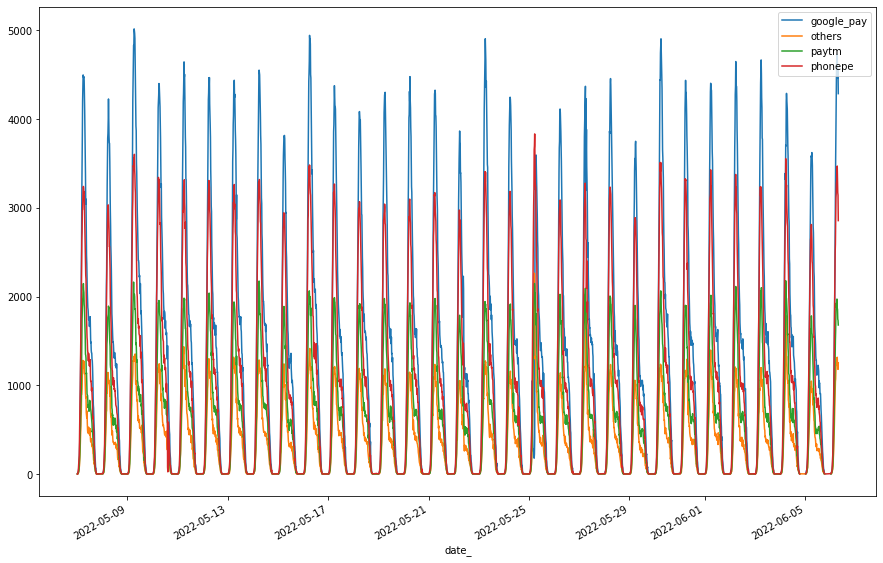

In [9]:
df.plot(figsize=(15,10))

<AxesSubplot:xlabel='date_'>

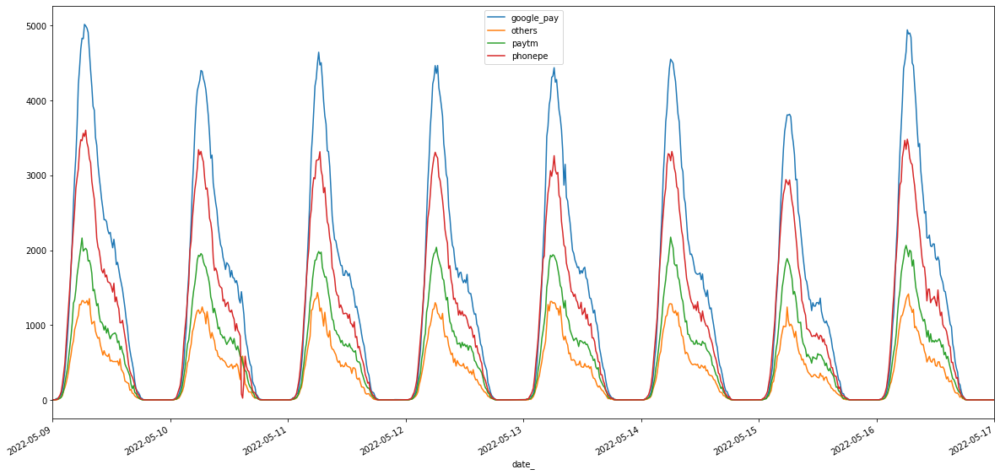

In [10]:
# Analyzing over the interval ['2022-05-09', '2022-05-17']
df.plot(xlim = (['2022-05-09', '2022-05-17']),figsize=(20,10))

<AxesSubplot:xlabel='date_'>

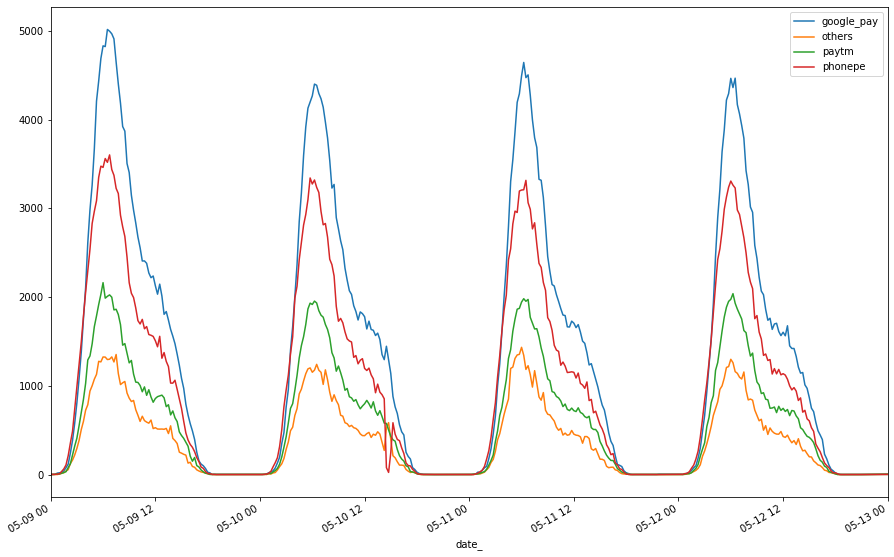

In [11]:
# Analyzing over a certainly lower interval ['2022-05-09', '2022-05-13']
df.plot(xlim = (['2022-05-09', '2022-05-13']),figsize=(15,10))

In [12]:
df['google_pay']

date_
2022-05-07 00:15:00       0.0
2022-05-07 00:30:00       0.0
2022-05-07 00:45:00       9.0
2022-05-07 01:00:00      23.0
2022-05-07 01:15:00      30.0
                        ...  
2022-06-06 06:45:00    4717.0
2022-06-06 07:00:00    4553.0
2022-06-06 07:15:00    4463.0
2022-06-06 07:30:00    4562.0
2022-06-06 07:45:00    4287.0
Name: google_pay, Length: 2308, dtype: float64

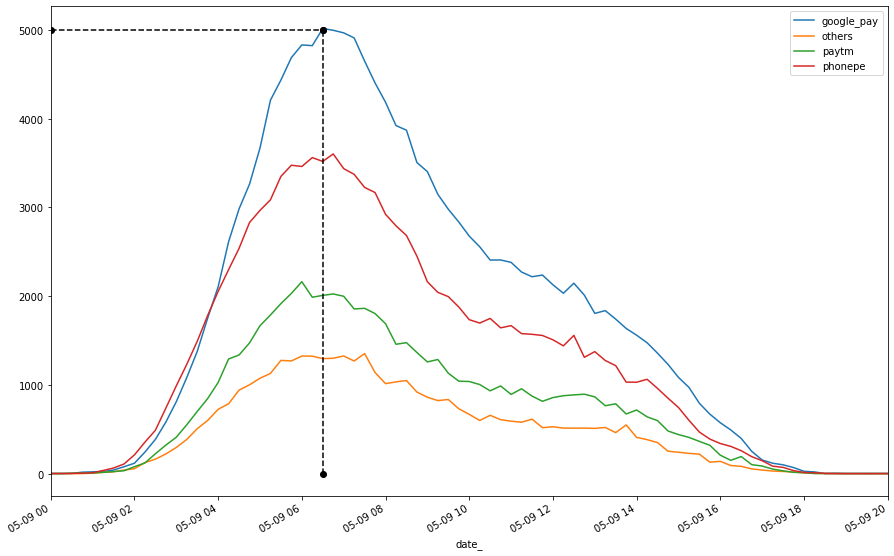

In [13]:
# Analyzing the trend in data over the interval ['2022-05-09 00:00', '2022-05-09 20:00']
df.plot(xlim = (['2022-05-09 00:00', '2022-05-09 20:00']),figsize=(15,10))
plt.plot((datetime(2022,5,9,0,0), datetime(2022,5,9,6,30)), (5000, 5000), marker='o', linestyle='--', color='black')
plt.plot((datetime(2022,5,9,6,30), datetime(2022,5,9,6,30)), (0, 5000), marker='o', linestyle='--', color='black')

## Broad Conclusion:

In [14]:
"""
We can generate a conclusion broadly over the entire dataset:

1. Over the certain interval of (2022-05-09 00:00) till (2022-05-09 20:00), we can observe a cetain
   upward trend till (2022-05-09 06:30) and downward trend henceforth but no upward or downward trend in the generalized
   dataset.

2. The entire data shows seasonality over a certain defined interval. This interval can be later analyzed using statistical means.

3. As from the profile report generated and even from the various plots we can concluded that our dataset is stationary overall.
   This can be broadly verified as there is no certain change in the mean and the standard deviation in the data over entire
   time interval of our data.
   This can be verified statistically using Dickey-Fuller Test.
   
4. There exist a certain level of noise which is very minimal and can be worked on later during the model building phase. 

"""
### We can access the following: Trend, seasonality, stationarity

'\nWe can generate a conclusion broadly over the entire dataset:\n\n1. Over the certain interval of (2022-05-09 00:00) till (2022-05-09 20:00), we can observe a cetain\n   upward trend till (2022-05-09 06:30) and downward trend henceforth but no upward or downward trend in the generalized\n   dataset.\n\n2. The entire data shows seasonality over a certain defined interval. This interval can be later analyzed using statistical means.\n\n3. As from the profile report generated and even from the various plots we can concluded that our dataset is stationary overall.\n   This can be broadly verified as there is no certain change in the mean and the standard deviation in the data over entire\n   time interval of our data.\n   This can be verified statistically using Dickey-Fuller Test.\n   \n4. There exist a certain level of noise which is very minimal and can be worked on later during the model building phase. \n\n'

# Individually analyzing each attribute(column) against the required Time Intervals

## Plotting "google_pay" to analyze the 

<AxesSubplot:xlabel='date_'>

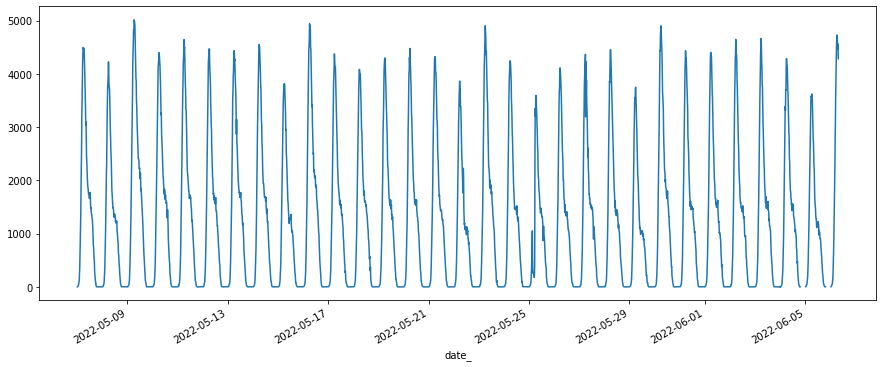

In [15]:
df.google_pay.plot(figsize=(15,6))

<AxesSubplot:xlabel='date_'>

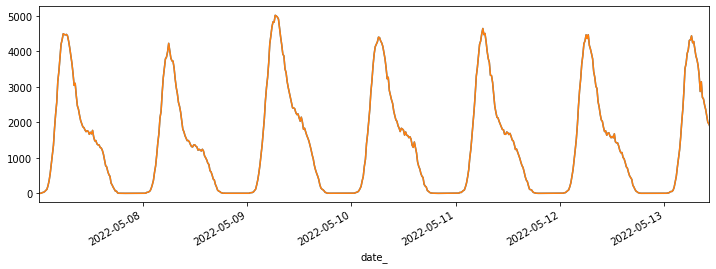

In [16]:
df.google_pay.plot(figsize=(20,10))
df['google_pay'].plot(xlim=['2022-05-07 00:15:00','2022-05-13 10:15:00'],figsize=(12,4))

<AxesSubplot:xlabel='date_'>

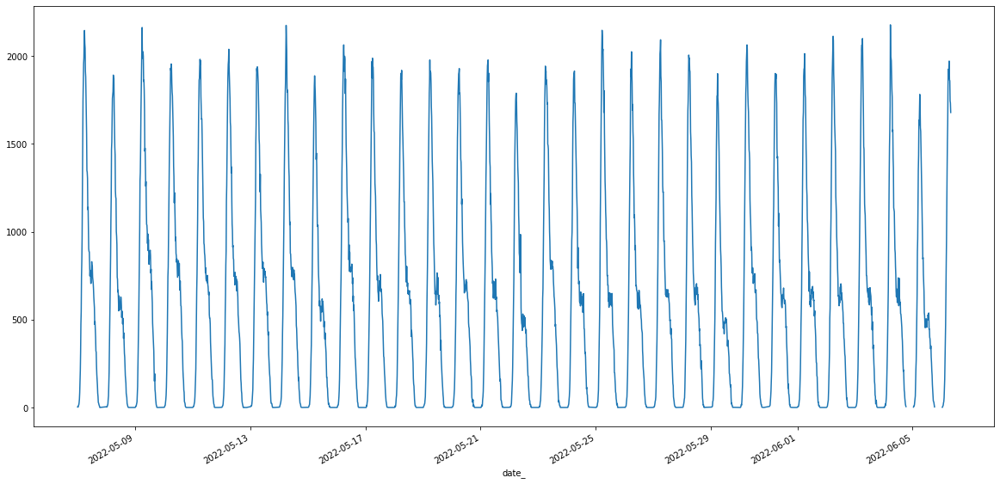

In [17]:
df.paytm.plot(figsize=(20,10))

<AxesSubplot:xlabel='date_'>

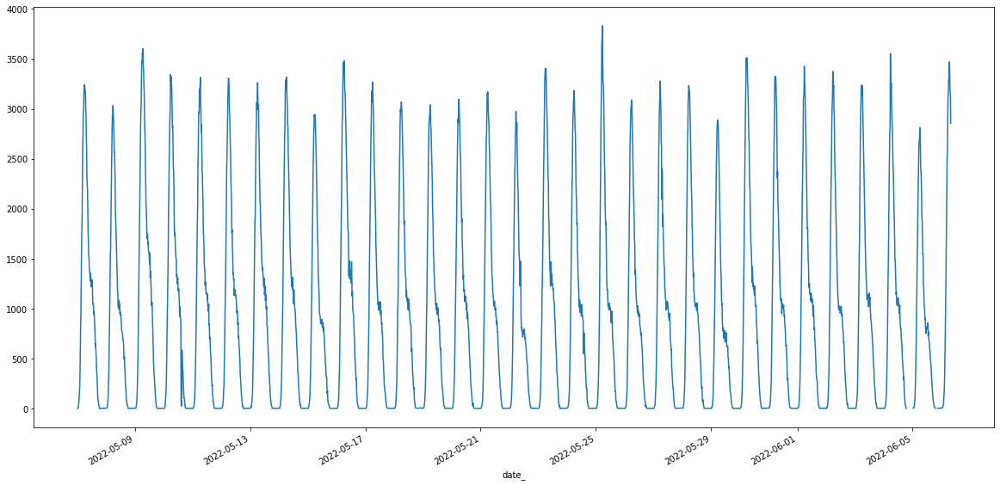

In [18]:
df.phonepe.plot(figsize=(20,10))

<AxesSubplot:xlabel='date_'>

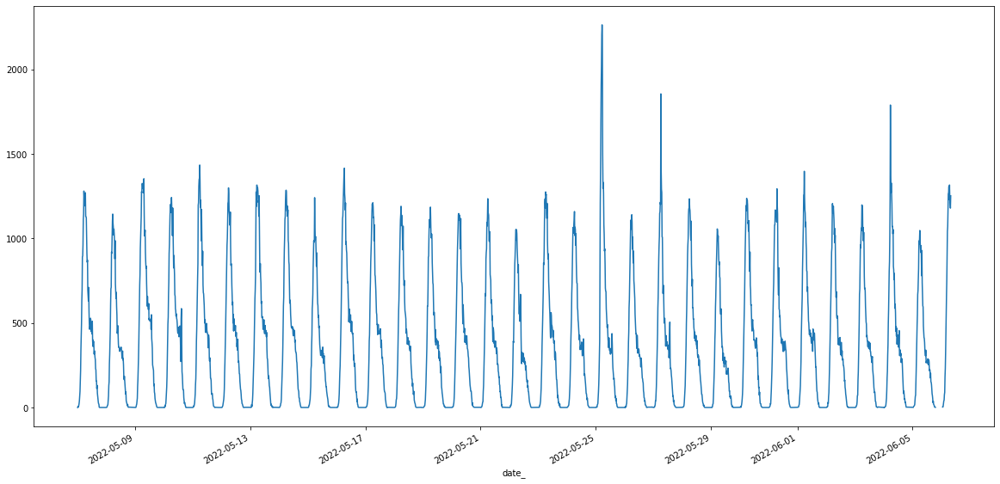

In [19]:
# date vs google_pay -> 
df.others.plot(figsize=(20,10))

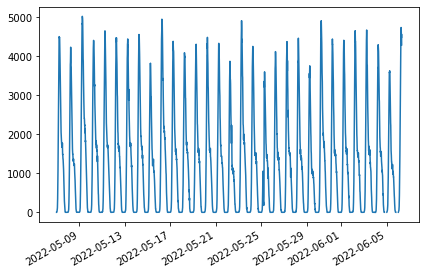

In [20]:
figure,axis=plt.subplots()
plt.tight_layout()
## Preventing overlapping
figure.autofmt_xdate()
axis.plot(df.index,df.google_pay)

In [21]:
df

,google_pay,others,paytm,phonepe
date_,,,,
2022-05-07 00:15:00,0.0,0.0,3.0,0.0
2022-05-07 00:30:00,0.0,5.0,2.0,5.0
2022-05-07 00:45:00,9.0,2.0,3.0,4.0
2022-05-07 01:00:00,23.0,5.0,13.0,26.0
2022-05-07 01:15:00,30.0,13.0,15.0,56.0
...,...,...,...,...
2022-06-06 06:45:00,4717.0,1316.0,1864.0,3471.0
2022-06-06 07:00:00,4553.0,1237.0,1860.0,3289.0
2022-06-06 07:15:00,4463.0,1206.0,1745.0,3171.0


# Performing Time Resampling for better analysis

In [22]:
# Resampling data for maximum data that got changed for year end basis
df.resample(rule='A').mean()

,google_pay,others,paytm,phonepe
date_,,,,
2022-12-31,1538.390191,434.06997,689.084421,1153.199219


D:\College Softwares\Anaconda\envs\fsds_ml\lib\site-packages\pandas\plotting\_matplotlib\core.py:1136: UserWarning: Attempting to set identical left == right == 52.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
D:\College Softwares\Anaconda\envs\fsds_ml\lib\site-packages\pandas\plotting\_matplotlib\core.py:1136: UserWarning: Attempting to set identical left == right == 52.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
D:\College Softwares\Anaconda\envs\fsds_ml\lib\site-packages\pandas\plotting\_matplotlib\core.py:1136: UserWarning: Attempting to set identical left == right == 52.0 results in singular transformations; automatically expanding.
  ax.set_xlim(left, right)
D:\College Softwares\Anaconda\envs\fsds_ml\lib\site-packages\pandas\plotting\_matplotlib\core.py:1136: UserWarning: Attempting to set identical left == right == 52.0 results in singular transformations; automatically expanding.
  ax.se

<AxesSubplot:xlabel='date_'>

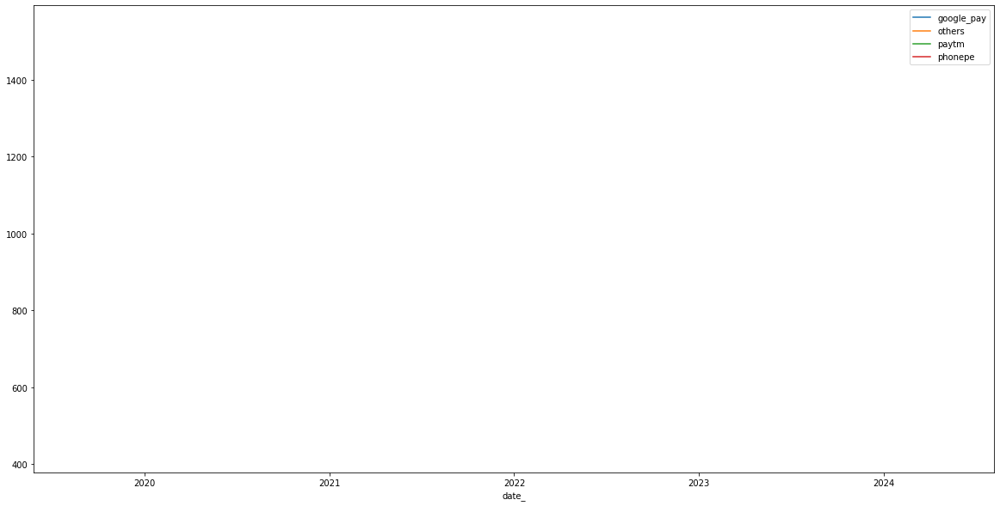

In [23]:
# Resampling data for maximum data that got changed for year end basis
df.resample(rule='A').mean().plot(figsize=(20,10))

In [24]:
# Resampling data for maximum data that got changed at month starting
df.resample(rule='MS').mean()

,google_pay,others,paytm,phonepe
date_,,,,
2022-05-01,1541.767196,435.502646,689.702116,1156.243915
2022-06-01,1522.973430,427.481752,686.223039,1139.299517


<AxesSubplot:xlabel='date_'>

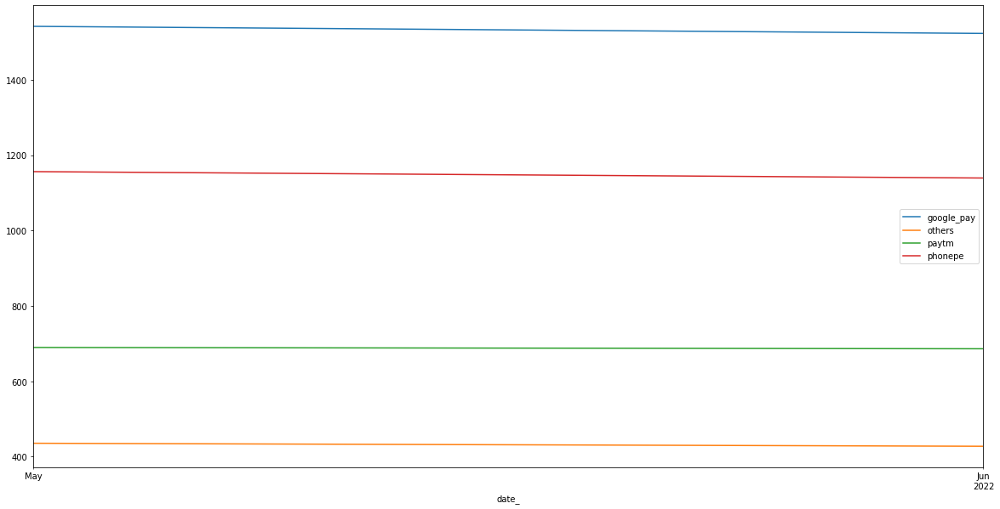

In [25]:
# Resampling data for maximum data that got changed at month starting
df.resample(rule='MS').mean().plot(figsize=(20,10))

In [26]:
# Resampling data for maximum data that got changed at month end
df.resample(rule='M').mean()


,google_pay,others,paytm,phonepe
date_,,,,
2022-05-31,1541.767196,435.502646,689.702116,1156.243915
2022-06-30,1522.973430,427.481752,686.223039,1139.299517


<AxesSubplot:xlabel='date_'>

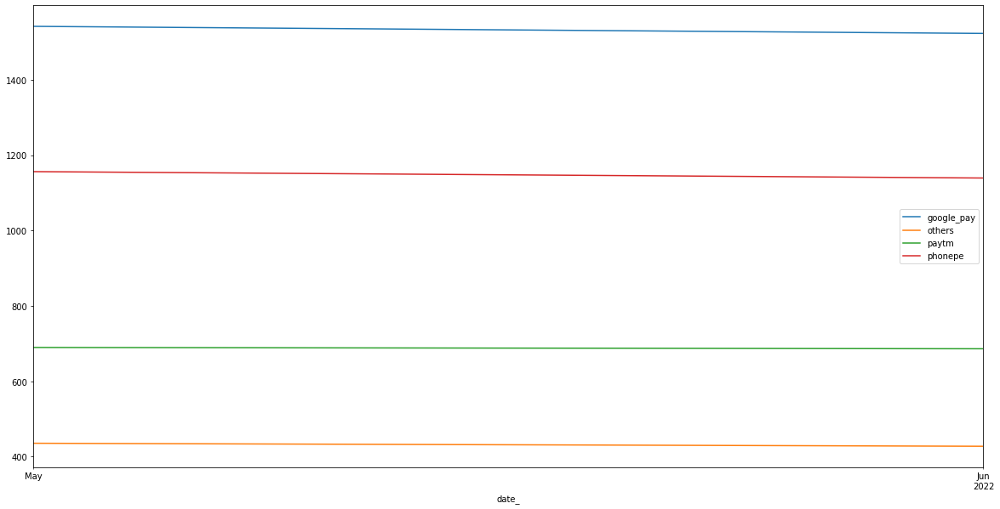

In [27]:
# Resampling data for maximum data that got changed at month end
df.resample(rule='M').mean().plot(figsize=(20,10))

In [28]:
# Resampling data for maximum data that got changed at weekly basis
df.resample(rule='W').mean()

,google_pay,others,paytm,phonepe
date_,,,,
2022-05-08,1540.753247,427.896104,692.506494,1148.175325
2022-05-15,1629.033771,459.446529,720.938086,1204.782364
2022-05-22,1543.777567,423.148289,680.826996,1135.475285
2022-05-29,1425.743346,423.623574,663.608365,1114.720532
2022-06-05,1517.500000,418.951311,674.407547,1127.031716
2022-06-12,2191.448276,674.714286,965.551724,1734.862069


<AxesSubplot:xlabel='date_'>

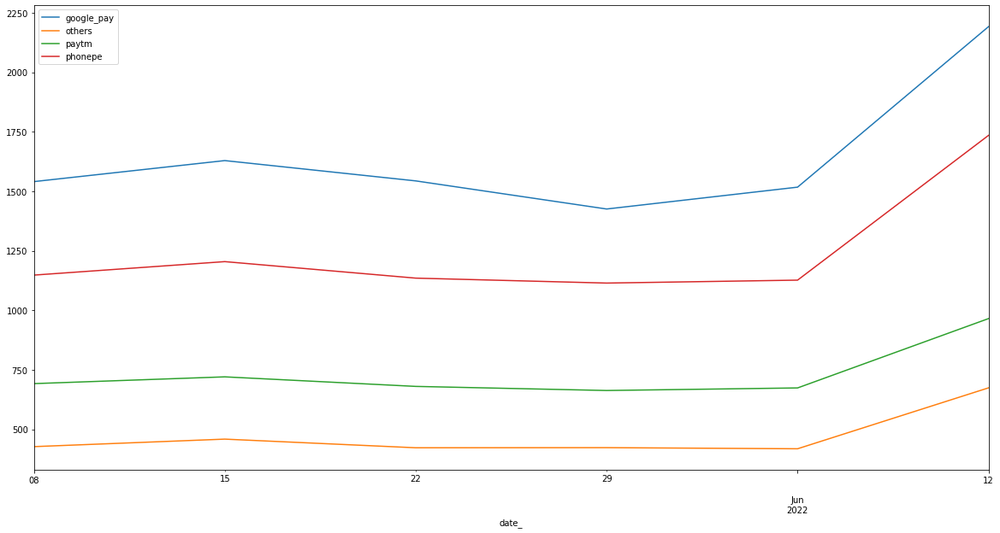

In [29]:
# Resampling data for maximum data that got changed at weekly basis
df.resample(rule='W').mean().plot(figsize=(20,10))

<AxesSubplot:xlabel='date_'>

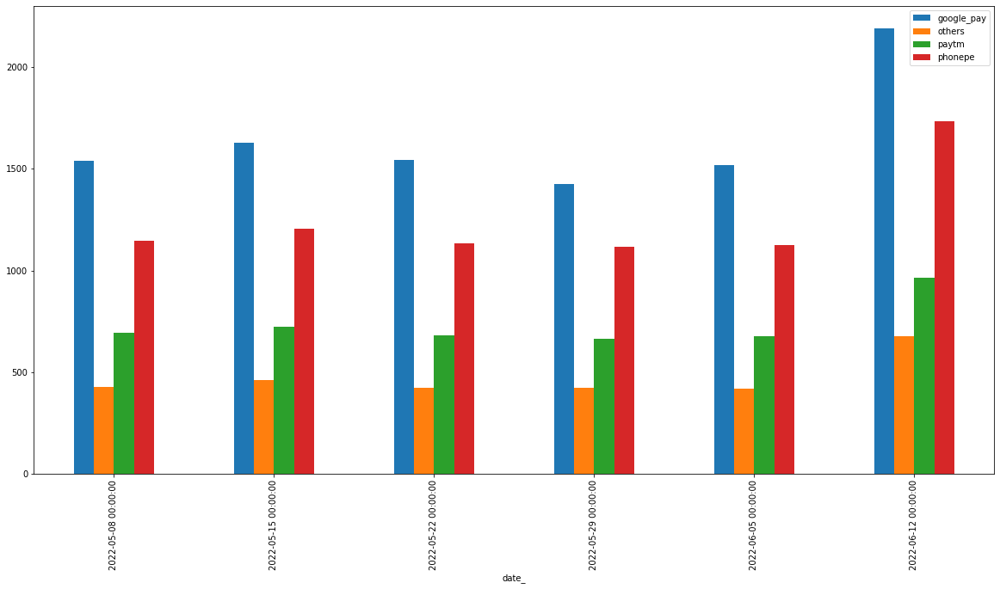

In [30]:
# Resampling data for maximum data that got changed at weekly basis
df.resample(rule='W').mean().plot(kind='bar', figsize=(20,10))

In [31]:
# Resampling data for maximum data that got changed at daily basis
df.resample(rule='D').max()

,google_pay,others,paytm,phonepe
date_,,,,
2022-05-07,4498.0,1280.0,2146.0,3241.0
2022-05-08,4227.0,1144.0,1892.0,3033.0
2022-05-09,5017.0,1353.0,2163.0,3603.0
2022-05-10,4401.0,1242.0,1955.0,3343.0
2022-05-11,4645.0,1434.0,1982.0,3316.0
2022-05-12,4468.0,1299.0,2039.0,3308.0
2022-05-13,4438.0,1315.0,1939.0,3263.0
2022-05-14,4552.0,1285.0,2175.0,3319.0
2022-05-15,3816.0,1241.0,1888.0,2943.0


<AxesSubplot:xlabel='date_'>

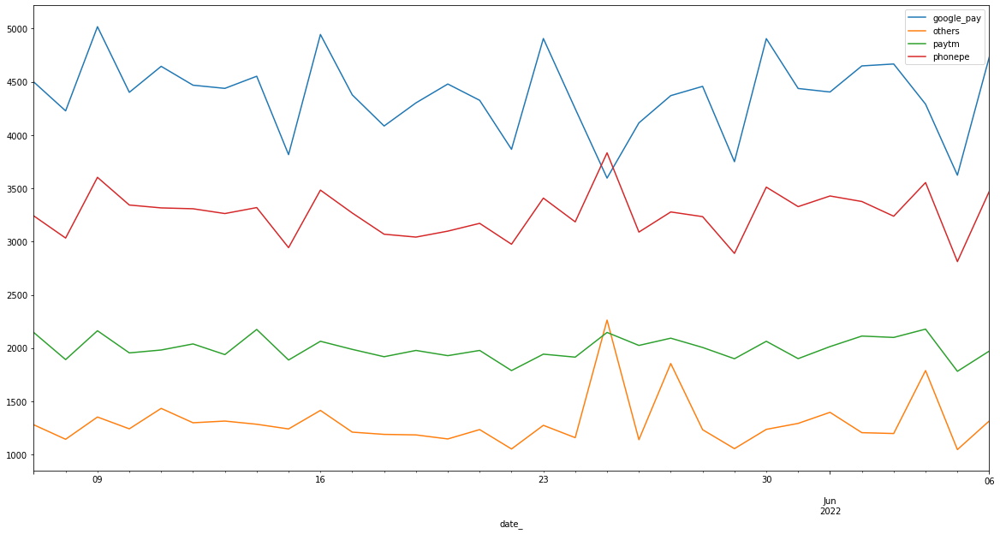

In [32]:
# Resampling data for maximum data that got changed at daily basis
df.resample(rule='D').max().plot(figsize=(20,10))

In [33]:
# Resampling data for data that got changed at daily basis
df.resample(rule='D').min()

,google_pay,others,paytm,phonepe
date_,,,,
2022-05-07,0.0,0.0,0.0,0.0
2022-05-08,2.0,0.0,0.0,0.0
2022-05-09,1.0,0.0,0.0,0.0
2022-05-10,0.0,0.0,0.0,0.0
2022-05-11,0.0,0.0,0.0,0.0
2022-05-12,0.0,0.0,0.0,0.0
2022-05-13,0.0,0.0,0.0,0.0
2022-05-14,1.0,0.0,0.0,0.0
2022-05-15,1.0,0.0,0.0,0.0


<AxesSubplot:xlabel='date_'>

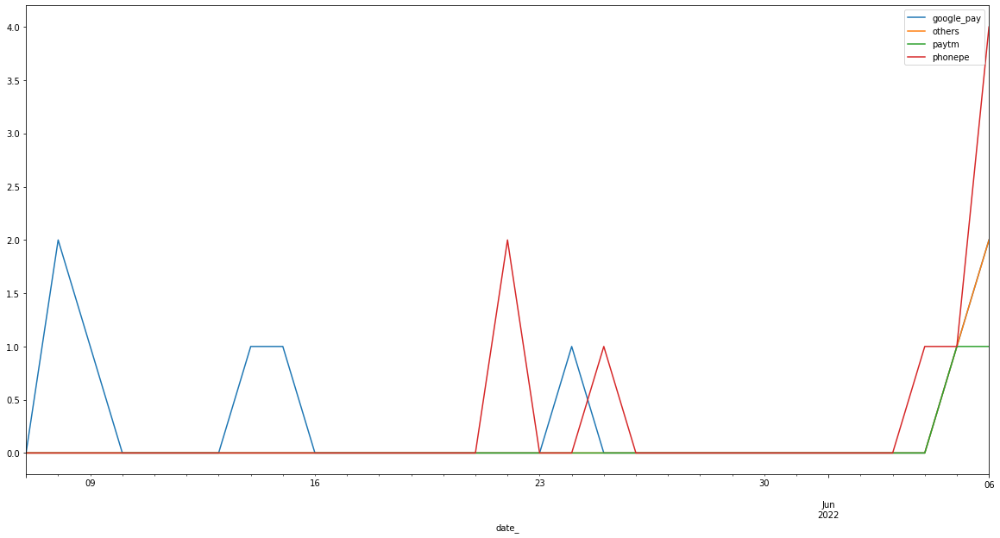

In [34]:
# Resampling data for data that got changed at daily basis
df.resample(rule='D').min().plot(figsize=(20,10))

In [35]:
# Resampling data for mean data that got changed at Daily basis
df.resample(rule='D').mean()

,google_pay,others,paytm,phonepe
date_,,,,
2022-05-07,1641.782051,460.846154,737.807692,1231.307692
2022-05-08,1437.065789,394.078947,646.013158,1062.855263
2022-05-09,1931.473684,524.565789,805.210526,1419.197368
2022-05-10,1671.818182,471.623377,739.766234,1207.701299
2022-05-11,1583.730769,457.410256,701.346154,1166.794872
2022-05-12,1576.539474,445.736842,721.315789,1176.815789
2022-05-13,1611.051948,464.259740,709.506494,1179.506494
2022-05-14,1683.094595,478.337838,752.162162,1262.310811
2022-05-15,1344.066667,373.386667,617.133333,1021.546667


<AxesSubplot:xlabel='date_'>

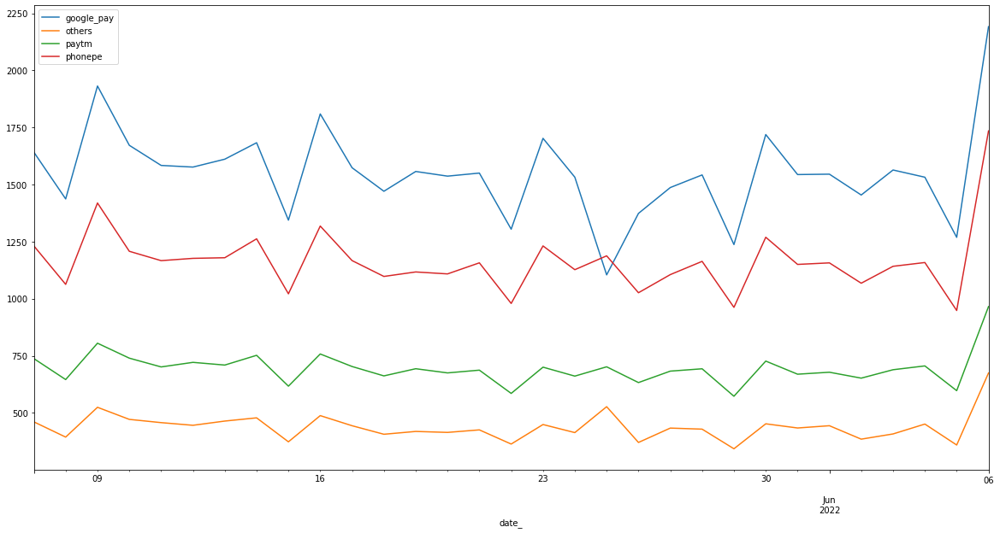

In [36]:
# Resampling data for mean data that got changed at Daily basis
df.resample(rule='D').mean().plot(figsize=(20,10))

<AxesSubplot:xlabel='date_'>

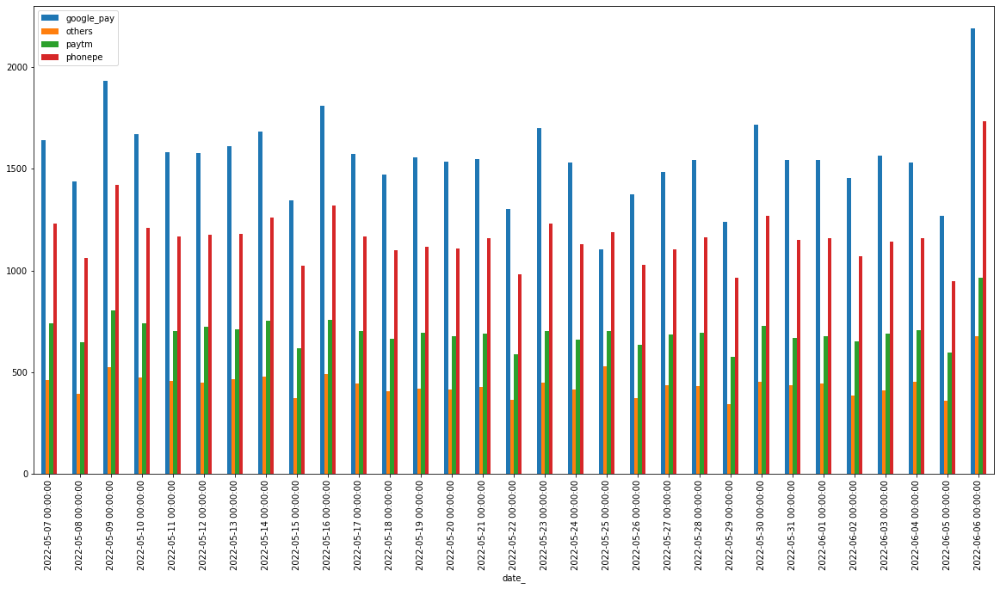

In [37]:
# Resampling data for mean data that got changed at Daily basis
df.resample(rule='D').mean().plot(kind='bar', figsize=(20,10))

In [38]:
# Resampling data for minimum data that got changed at Hourly basis
df.resample(rule='H').min()

,google_pay,others,paytm,phonepe
date_,,,,
2022-05-07 00:00:00,0.0,0.0,2.0,0.0
2022-05-07 01:00:00,23.0,5.0,13.0,26.0
2022-05-07 02:00:00,114.0,64.0,84.0,207.0
2022-05-07 03:00:00,834.0,338.0,476.0,962.0
2022-05-07 04:00:00,2234.0,695.0,962.0,1891.0
...,...,...,...,...
2022-06-06 03:00:00,434.0,180.0,266.0,562.0
2022-06-06 04:00:00,1452.0,547.0,810.0,1600.0
2022-06-06 05:00:00,3184.0,1040.0,1513.0,2590.0


<AxesSubplot:xlabel='date_'>

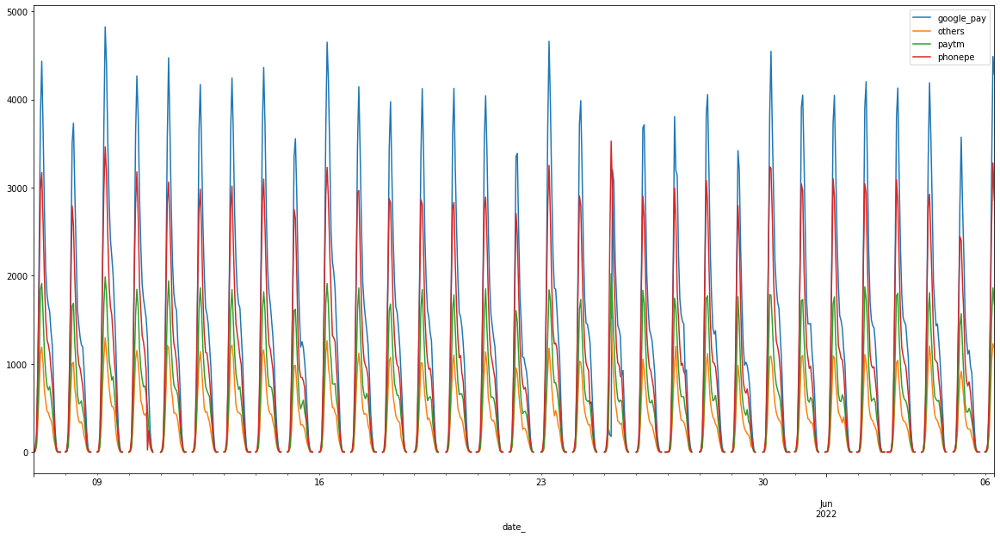

In [39]:
# Resampling data for minimum data that got changed at Hourly basis
df.resample(rule='H').min().plot(figsize=(20,10))

In [40]:
# Resampling data for maximum data that got changed at Hourly basis
df.resample(rule='H').max()

,google_pay,others,paytm,phonepe
date_,,,,
2022-05-07 00:00:00,9.0,5.0,3.0,5.0
2022-05-07 01:00:00,83.0,40.0,46.0,151.0
2022-05-07 02:00:00,556.0,219.0,315.0,794.0
2022-05-07 03:00:00,1837.0,630.0,830.0,1776.0
2022-05-07 04:00:00,3439.0,963.0,1745.0,2727.0
...,...,...,...,...
2022-06-06 03:00:00,1202.0,448.0,659.0,1260.0
2022-06-06 04:00:00,2755.0,912.0,1352.0,2492.0
2022-06-06 05:00:00,4332.0,1264.0,1925.0,3157.0


<AxesSubplot:xlabel='date_'>

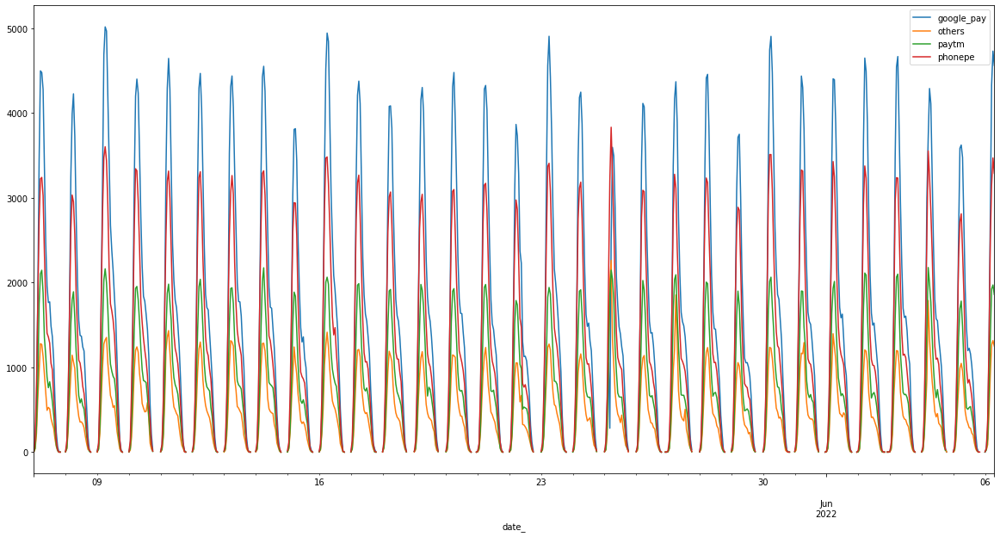

In [41]:
# Resampling data for maximum data that got changed at Hourly basis
df.resample(rule='H').max().plot(figsize=(20,10))

<AxesSubplot:xlabel='date_'>

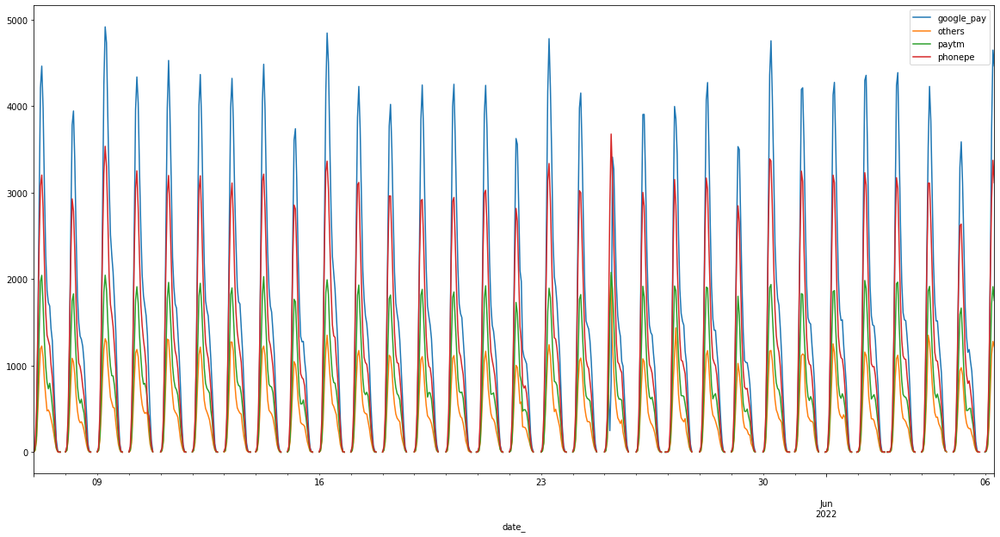

In [42]:
# Resampling data for mean data that got changed at Hourly basis
df.resample(rule='H').mean().plot(figsize=(20,10))

In [43]:
# Resampling data for mean data that got changed at Minute level basis
df.resample(rule='T').mean()

,google_pay,others,paytm,phonepe
date_,,,,
2022-05-07 00:15:00,0.0,0.0,3.0,0.0
2022-05-07 00:16:00,NaN,NaN,NaN,NaN
2022-05-07 00:17:00,NaN,NaN,NaN,NaN
2022-05-07 00:18:00,NaN,NaN,NaN,NaN
2022-05-07 00:19:00,NaN,NaN,NaN,NaN
...,...,...,...,...
2022-06-06 07:41:00,NaN,NaN,NaN,NaN
2022-06-06 07:42:00,NaN,NaN,NaN,NaN
2022-06-06 07:43:00,NaN,NaN,NaN,NaN


<AxesSubplot:xlabel='date_'>

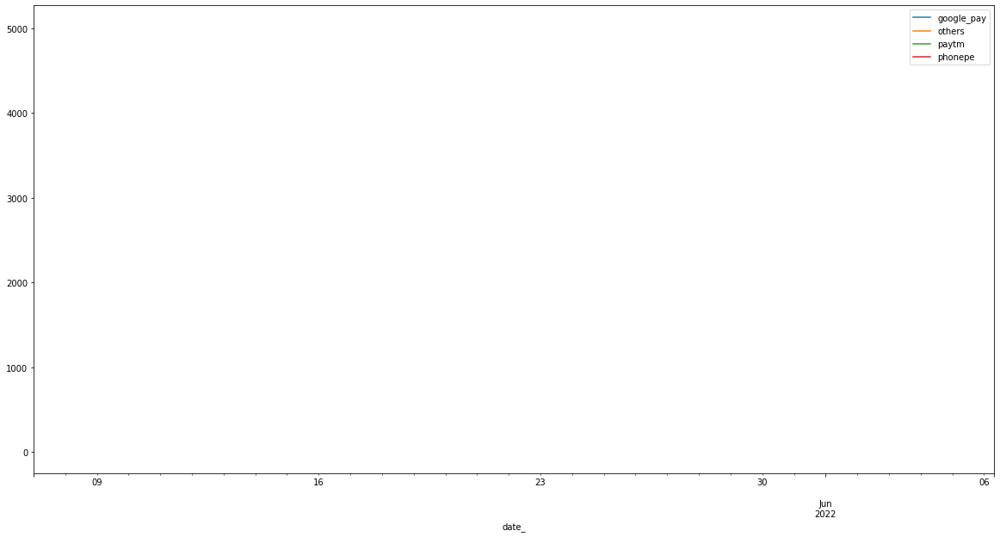

In [44]:
# Resampling data for mean data that got changed at Minute level basis
df.resample(rule='T').mean().plot(figsize=(20,10))

## Broad Conclusions:

# Various conclusions can be generated as:
## 1. After resampling and observing the changes in our data for different segments/time intervals, we can say that:

(a) Yearly Analysis for changes at Year End:
  > For Year End Resampling, only one major change in the data was found for the maximum, minimum and mean aggregation.
  > This was even observed through the graph.
    
(b) Monthly Analysis for changes at Month Starting:
  > For the Monthly Starting Frequency Sampling, slight or no certainly high(spike) changes were observed.
  > After observing the numerical values also it was observed that only at 2 particular datetimes(2022-05-01 and 2022-06-01), 
    a slight dispersion in all attributes were observed.
  > This was even observed through the graph. Here, the graph was almost a dispersed line.

(c) Monthly Analysis for changes at Month Ending: 
  > For the Monthly End Frequency Sampling, similar trend or pattern was observed as at in the Starting of the Month.
  > After observing the numerical values also it was observed that only at 2 particular datetimes(2022-05-30 and 2022-06-31),
    a slight dispersion in all attributes were observed.
  > This was even observed through the graph. Here, the graph was almost a dispersed line.

## Now as there were changes in the trend (yet not so significant were observed so analysis the resampling for further lower time intervals

(d) Weakly Changes Analysis:
  > Now after Weakly Resampling, furthur changes were observed in our dataset over time.
  > As it was observed in the resampled data that number of dispersed/changed trend increased as compared to previous      durations.
  > Yet there was very slight change in pattern in our data for lower time period but during the beginning week for the month of June 2022. This change is very significant as the spike was really high and did not matched any previous pattern.

## Now resampling our data for lower intervals to analyze the spike observed from the previous observations

(e) Daily Change Analysis:
  > At the daily level, for different attributes different patterns were observed.
    (i)  Google Pay, (ii) Phone Pe, (iii) Paytm, (iv) Others
  > Even though the values for the corresponding attribute were at different scaled, but when considered individually they showed direct relation with the Time Intervals. It should be noted that it was for Daily level Resampling.
  > One more important thing to be noted is that each attribute showcases stationary pattern that is having a ~constant mean and standard deviation.
  > This can furthur be analyzed using the Statistical Dickey Fuller Test.
  > This can even be seen through the graph.

## Even though we observed major key points from Daily Resampling method but analyzing for Hourly Basis
  
(f) Hourly Change Analysis:
  > For hourly basis it was also observed when we earlier plotted our generalized dataset.
  > So this was fairly expected.
  > From the graph we can verify the similar trends showcased by each attribute to the time interval thus showcasing the direct relationships over a broad level.
  > Again we can see the stationarity in our dataset.

## Even though it is not necessary for further resampling but analyzing at minute level
  
(f) Minute Level Change Analysis:
  > At minute level there was such frequency change at this level.
  > This can be easily observed from the graph too.
  
## So no further analysis to be performed for lower time intervals(seconds or miliseconds)


In [45]:
# Data
df

,google_pay,others,paytm,phonepe
date_,,,,
2022-05-07 00:15:00,0.0,0.0,3.0,0.0
2022-05-07 00:30:00,0.0,5.0,2.0,5.0
2022-05-07 00:45:00,9.0,2.0,3.0,4.0
2022-05-07 01:00:00,23.0,5.0,13.0,26.0
2022-05-07 01:15:00,30.0,13.0,15.0,56.0
...,...,...,...,...
2022-06-06 06:45:00,4717.0,1316.0,1864.0,3471.0
2022-06-06 07:00:00,4553.0,1237.0,1860.0,3289.0
2022-06-06 07:15:00,4463.0,1206.0,1745.0,3171.0


In [46]:
df.head(50)

,google_pay,others,paytm,phonepe
date_,,,,
2022-05-07 00:15:00,0.0,0.0,3.0,0.0
2022-05-07 00:30:00,0.0,5.0,2.0,5.0
2022-05-07 00:45:00,9.0,2.0,3.0,4.0
2022-05-07 01:00:00,23.0,5.0,13.0,26.0
2022-05-07 01:15:00,30.0,13.0,15.0,56.0
2022-05-07 01:30:00,52.0,24.0,27.0,106.0
2022-05-07 01:45:00,83.0,40.0,46.0,151.0
2022-05-07 02:00:00,114.0,64.0,84.0,207.0
2022-05-07 02:15:00,216.0,95.0,140.0,359.0


<AxesSubplot:xlabel='date_'>

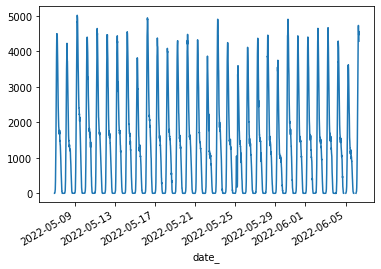

In [47]:
df.google_pay.plot()

In [48]:
df

,google_pay,others,paytm,phonepe
date_,,,,
2022-05-07 00:15:00,0.0,0.0,3.0,0.0
2022-05-07 00:30:00,0.0,5.0,2.0,5.0
2022-05-07 00:45:00,9.0,2.0,3.0,4.0
2022-05-07 01:00:00,23.0,5.0,13.0,26.0
2022-05-07 01:15:00,30.0,13.0,15.0,56.0
...,...,...,...,...
2022-06-06 06:45:00,4717.0,1316.0,1864.0,3471.0
2022-06-06 07:00:00,4553.0,1237.0,1860.0,3289.0
2022-06-06 07:15:00,4463.0,1206.0,1745.0,3171.0


# Further analyzing the seasonality window for our dataset

## Plotting for various timestamps windows in order to find the best window for 'google_pay' attribute

<AxesSubplot:xlabel='date_'>

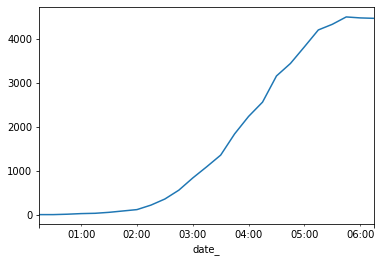

In [49]:
df.google_pay.head(25).plot()

<AxesSubplot:xlabel='date_'>

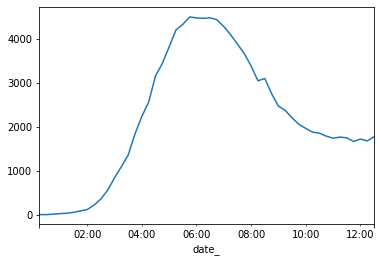

In [50]:
df.google_pay.head(50).plot()

<AxesSubplot:xlabel='date_'>

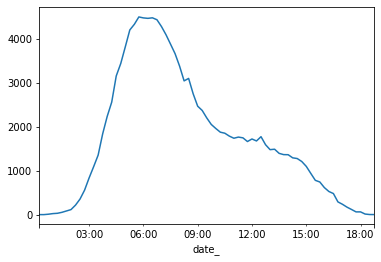

In [51]:
df.google_pay.head(75).plot()

<AxesSubplot:xlabel='date_'>

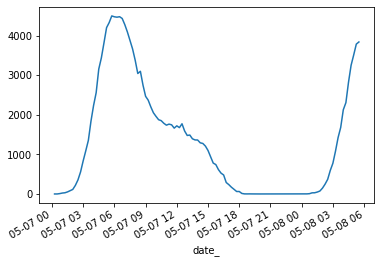

In [52]:
df.google_pay.head(100).plot()

<AxesSubplot:xlabel='date_'>

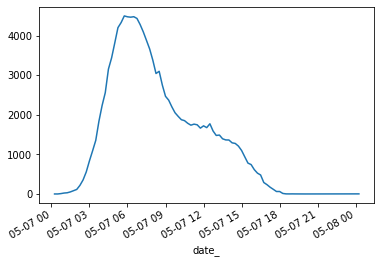

In [53]:
df.google_pay.head(79).plot()

<AxesSubplot:xlabel='date_'>

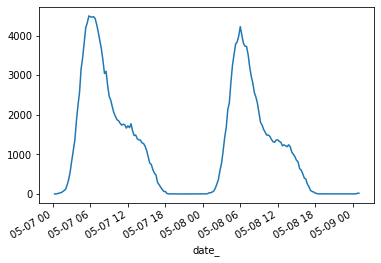

In [54]:
df.google_pay.head(158).plot()

<AxesSubplot:xlabel='date_'>

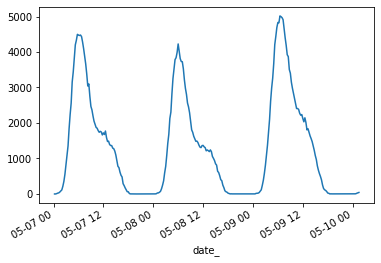

In [55]:
df.google_pay.head(237).plot()

<AxesSubplot:xlabel='date_'>

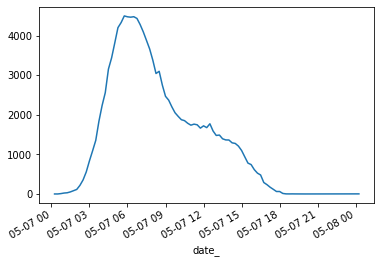

In [56]:
df.google_pay.head(79).plot()

## General Conclusions:
- As we already know that our dataset showcases certain kind of seasonality.
- Though this seasonality can be observed over daily basis.
- As it can also be seen in the graph above:
> Over the time window '2022-05-07 00:00:00' to '2022-05-08 00:00:00', that is, for a single day, the same pattern repeats over time.

# Dickey Fuller Test:
* Now performing the Fuller Test in order to understand and statistically verify the stationary features of our dataset.
- It is one of the most commonly used statistical test when it comes to analyzing the stationary of a series.
- As from the graph, we came up with the conclusion that our dataset is completely stationary as it showcases a constant mean and standard deviation value.
- But this can be statistically verified and proven using the Dickey-Fuller Test Statsitics. 
- Various Key Points for performing this test:
    - We can define our <b>NULL Hypothesis($H_{0}$)</b> as: The Data is not Stationary. Thus, the Unit Root value(Φ) = 1.
    - Thus, the <b>ALTERNATE Hypothesis($H_{1}$)</b> can be defined as: The Data is Stationary. Thus, the Unit Root value(Φ) < 1
  


In [57]:
df1 = df.dropna(axis=0)

In [58]:
df1

,google_pay,others,paytm,phonepe
date_,,,,
2022-05-07 00:15:00,0.0,0.0,3.0,0.0
2022-05-07 00:30:00,0.0,5.0,2.0,5.0
2022-05-07 00:45:00,9.0,2.0,3.0,4.0
2022-05-07 01:00:00,23.0,5.0,13.0,26.0
2022-05-07 01:15:00,30.0,13.0,15.0,56.0
...,...,...,...,...
2022-06-06 06:45:00,4717.0,1316.0,1864.0,3471.0
2022-06-06 07:00:00,4553.0,1237.0,1860.0,3289.0
2022-06-06 07:15:00,4463.0,1206.0,1745.0,3171.0


In [59]:
def adf_statistics(data):
    
    test_statistics = adfuller(data)
    adf_stats = test_statistics[0]
    p_value = test_statistics[1]
    
    if p_value < 0.05:
        result = "As the p-value is less than 0.05 so there exist strong evidences against the NULL HYPOTHESIS(H0). So there is no existence of Unit Root. And thus, we can reject the NULL HYPOTHESIS(H0) and except the ALTERNATE HYPOTHESIS(H1). Therefore, Data is Stationary"
    else:
        result = "As the p-value is more than 0.05 so there does not exist evidences against the NULL HYPOTHESIS(H0). So there exist Unit Root. And thus, we can reject the ALTERNATE HYPOTHESIS(H1) and accept the NULL HYPOTHESIS(H0). Therefore, Data is Non-Stationary"
    
    print(f"Dickey Fuller Statistics Value: {adf_stats}\n\nP-Value: {p_value}\n\nCONCLUSION: {result}")

## ADF statistics for 'google_pay' attribute

In [60]:
adf_statistics(df1.google_pay)

Dickey Fuller Statistics Value: -12.704712167525226

P-Value: 1.0612325370563679e-23

CONCLUSION: As the p-value is less than 0.05 so there exist strong evidences against the NULL HYPOTHESIS(H0). So there is no existence of Unit Root. And thus, we can reject the NULL HYPOTHESIS(H0) and except the ALTERNATE HYPOTHESIS(H1). Therefore, Data is Stationary


## ADF statistics for 'paytm' attribute

In [61]:
adf_statistics(df1.paytm)

Dickey Fuller Statistics Value: -12.980005182331002

P-Value: 2.957292400228603e-24

CONCLUSION: As the p-value is less than 0.05 so there exist strong evidences against the NULL HYPOTHESIS(H0). So there is no existence of Unit Root. And thus, we can reject the NULL HYPOTHESIS(H0) and except the ALTERNATE HYPOTHESIS(H1). Therefore, Data is Stationary


## ADF statistics for 'phonepe' attribute

In [62]:
adf_statistics(df1.phonepe)

Dickey Fuller Statistics Value: -12.533559073255535

P-Value: 2.3990513450443316e-23

CONCLUSION: As the p-value is less than 0.05 so there exist strong evidences against the NULL HYPOTHESIS(H0). So there is no existence of Unit Root. And thus, we can reject the NULL HYPOTHESIS(H0) and except the ALTERNATE HYPOTHESIS(H1). Therefore, Data is Stationary


## ADF statistics for 'others' attribute

In [63]:
adf_statistics(df1.others)

Dickey Fuller Statistics Value: -12.366978195313989

P-Value: 5.38683592453561e-23

CONCLUSION: As the p-value is less than 0.05 so there exist strong evidences against the NULL HYPOTHESIS(H0). So there is no existence of Unit Root. And thus, we can reject the NULL HYPOTHESIS(H0) and except the ALTERNATE HYPOTHESIS(H1). Therefore, Data is Stationary


# - Therefore, after performing the Dickey Fuller Test for each attribute, we can finally conclude (even statistically) that our dataset is completely stationary.
# - As for each attribute the p-value was less than 0.05 thus providing evidence for our ALTERNATE HYPOTHESIS($H_{1}$). 
# - Hence, ensuring the Dataset to be stationary.

# Formulating Dataset for Prediction

> We are going to utilize Linear Regression model for modelling our data based on the timestamps as we are having continuous dataset.

> So we need to perform some transformations on our timestamp index, as our model cannot directly utilize timestamps as input.

> So we need to unravel our timestamps or generate some dummies in order to unify them.

- We will use time-step features which can be derived directly from the time index.
- The most basic time-step feature is the time dummy, which counts off time steps in the series from beginning to end.
- Linear regression with the time dummy produces the model:
> <b>target_outcome = weight * timestamp + bias</b>
- Here the time dummy lets us fit curves to time series in a time plot, where Time forms the x-axis.


In [64]:
df1['Time'] = np.arange(len(df1.index))

D:\College Softwares\Anaconda\envs\fsds_ml\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [65]:
# Our Final dataset is prepared
df1

,google_pay,others,paytm,phonepe,Time
date_,,,,,
2022-05-07 00:15:00,0.0,0.0,3.0,0.0,0
2022-05-07 00:30:00,0.0,5.0,2.0,5.0,1
2022-05-07 00:45:00,9.0,2.0,3.0,4.0,2
2022-05-07 01:00:00,23.0,5.0,13.0,26.0,3
2022-05-07 01:15:00,30.0,13.0,15.0,56.0,4
...,...,...,...,...,...
2022-06-06 06:45:00,4717.0,1316.0,1864.0,3471.0,2290
2022-06-06 07:00:00,4553.0,1237.0,1860.0,3289.0,2291
2022-06-06 07:15:00,4463.0,1206.0,1745.0,3171.0,2292


# Plotting box-plot for visualizing anomalies for our entire dataset

In [66]:
import plotly.express as px
fig = px.box(df1, height=750)
fig.show()

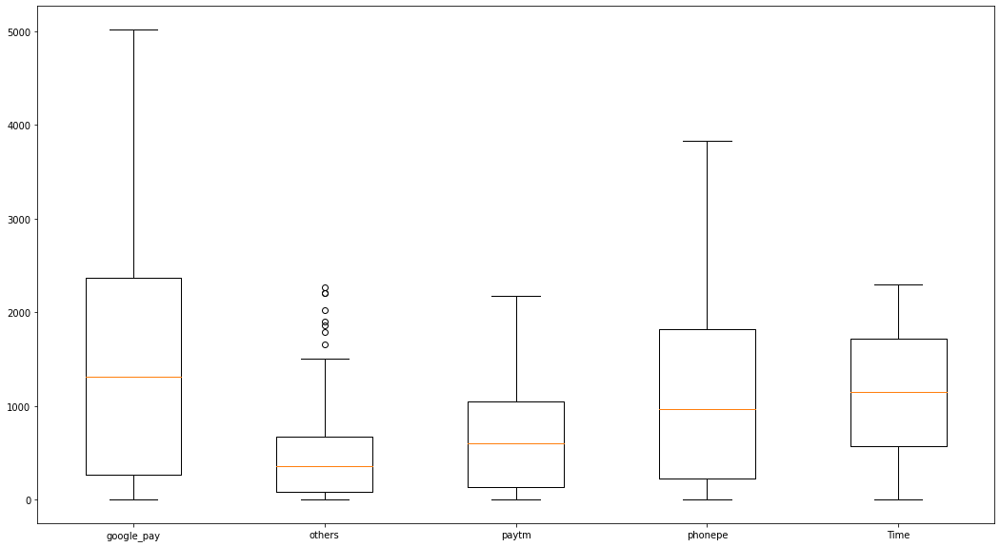

In [67]:
plt.rcParams["figure.figsize"] = [18, 10]
plt.boxplot(df1,labels=df1.columns, )
plt.show()

## Generic Outlier Function for Evaluation

In [68]:
def get_outlier_points(input_df):
    q1 = np.quantile(input_df, 0.25)
    q3 = np.quantile(input_df, 0.75)
    med = np.median(input_df)
    
    iqr = q3-q1
    
    upper_bound = q3+(1.5*iqr)
    lower_bound = q1-(1.5*iqr)
    
    outliers = input_df[(input_df <= lower_bound) | (input_df >= upper_bound)]
    print('The following are the outliers in the boxplot:{}'.format(outliers))
    return outliers

## Creating training and testing datasets

- 80 percent
> 80 percent

In [69]:
# 80 %
train_end_index = int(.80*2295)

train_df = df1[df1.Time < train_end_index]

# 20 %
test_df = df1[df1.Time > train_end_index]

In [70]:
train_df

,google_pay,others,paytm,phonepe,Time
date_,,,,,
2022-05-07 00:15:00,0.0,0.0,3.0,0.0,0
2022-05-07 00:30:00,0.0,5.0,2.0,5.0,1
2022-05-07 00:45:00,9.0,2.0,3.0,4.0,2
2022-05-07 01:00:00,23.0,5.0,13.0,26.0,3
2022-05-07 01:15:00,30.0,13.0,15.0,56.0,4
...,...,...,...,...,...
2022-05-31 04:30:00,3042.0,883.0,1373.0,2617.0,1831
2022-05-31 04:45:00,3330.0,984.0,1542.0,2765.0,1832
2022-05-31 05:00:00,3912.0,1079.0,1719.0,3042.0,1833


In [71]:
test_df

,google_pay,others,paytm,phonepe,Time
date_,,,,,
2022-05-31 06:00:00,4296.0,1161.0,1870.0,3317.0,1837
2022-05-31 06:15:00,4300.0,1136.0,1897.0,3195.0,1838
2022-05-31 06:30:00,4206.0,1148.0,1793.0,3047.0,1839
2022-05-31 06:45:00,4050.0,1097.0,1732.0,2960.0,1840
2022-05-31 07:00:00,3812.0,1293.0,1473.0,2672.0,1841
...,...,...,...,...,...
2022-06-06 06:45:00,4717.0,1316.0,1864.0,3471.0,2290
2022-06-06 07:00:00,4553.0,1237.0,1860.0,3289.0,2291
2022-06-06 07:15:00,4463.0,1206.0,1745.0,3171.0,2292


# Splitting the Features and Labels columns

# 1. For 'others' attribute for our Dataset

## Plotting the box-plot to visualize the anomalies in our Dataset for 'others' attribute

D:\College Softwares\Anaconda\envs\fsds_ml\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='others'>

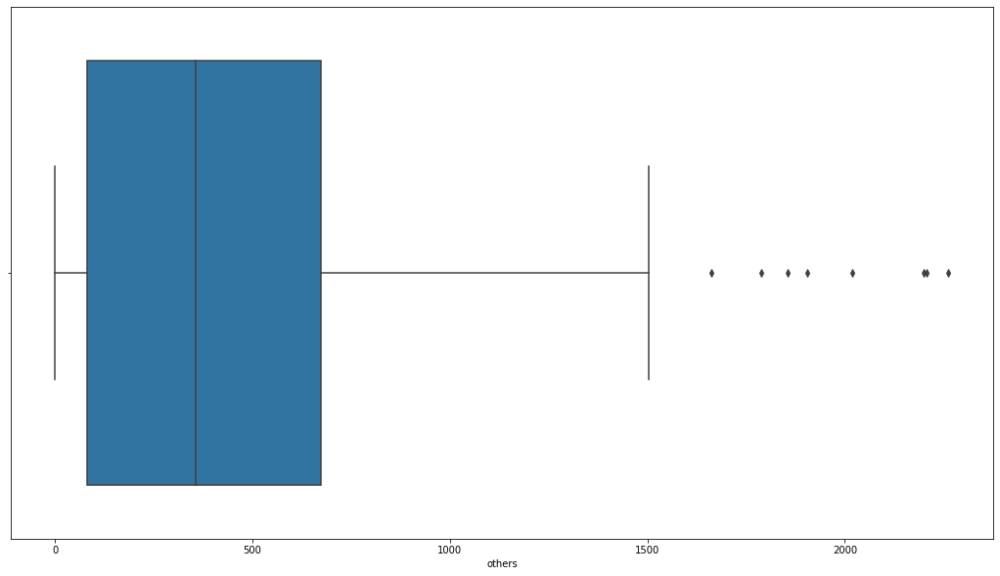

In [72]:
sns.boxplot(df1.others, orient='h')

In [73]:
import plotly.express as px
fig = px.box(df1.others, height=750)
fig.show()

In [74]:
x_train_others = train_df.loc[:,['Time']]
y_train_others = train_df.loc[:,'others']

x_test_others = test_df.loc[:,['Time']]
y_test_others = test_df.loc[:,'others']

In [75]:
x_train_others

,Time
date_,
2022-05-07 00:15:00,0
2022-05-07 00:30:00,1
2022-05-07 00:45:00,2
2022-05-07 01:00:00,3
2022-05-07 01:15:00,4
...,...
2022-05-31 04:30:00,1831
2022-05-31 04:45:00,1832
2022-05-31 05:00:00,1833


In [76]:
y_train_others

date_
2022-05-07 00:15:00       0.0
2022-05-07 00:30:00       5.0
2022-05-07 00:45:00       2.0
2022-05-07 01:00:00       5.0
2022-05-07 01:15:00      13.0
                        ...  
2022-05-31 04:30:00     883.0
2022-05-31 04:45:00     984.0
2022-05-31 05:00:00    1079.0
2022-05-31 05:15:00    1080.0
2022-05-31 05:30:00    1168.0
Name: others, Length: 1836, dtype: float64

In [77]:
x_test_others

,Time
date_,
2022-05-31 06:00:00,1837
2022-05-31 06:15:00,1838
2022-05-31 06:30:00,1839
2022-05-31 06:45:00,1840
2022-05-31 07:00:00,1841
...,...
2022-06-06 06:45:00,2290
2022-06-06 07:00:00,2291
2022-06-06 07:15:00,2292


In [78]:
y_test_others

date_
2022-05-31 06:00:00    1161.0
2022-05-31 06:15:00    1136.0
2022-05-31 06:30:00    1148.0
2022-05-31 06:45:00    1097.0
2022-05-31 07:00:00    1293.0
                        ...  
2022-06-06 06:45:00    1316.0
2022-06-06 07:00:00    1237.0
2022-06-06 07:15:00    1206.0
2022-06-06 07:30:00    1179.0
2022-06-06 07:45:00    1252.0
Name: others, Length: 458, dtype: float64

In [79]:
y_train_others,x_train_others = y_train_others.align(x_train_others, join='inner')

In [80]:
from sklearn.linear_model import LinearRegression

lr_others = LinearRegression()

lr_others.fit(x_train_others,y_train_others)

LinearRegression()

In [81]:
y_pred_others = pd.Series(lr_others.predict(x_test_others), index=x_test_others.index)
y_pred_others

date_
2022-05-31 06:00:00    398.822370
2022-05-31 06:15:00    398.782545
2022-05-31 06:30:00    398.742721
2022-05-31 06:45:00    398.702896
2022-05-31 07:00:00    398.663071
                          ...    
2022-06-06 06:45:00    380.781784
2022-06-06 07:00:00    380.741959
2022-06-06 07:15:00    380.702134
2022-06-06 07:30:00    380.662310
2022-06-06 07:45:00    380.622485
Length: 458, dtype: float64

In [82]:
# Acquiring anomaly points for others attribute
outlier_points_others = get_outlier_points(df1.others)

The following are the outliers in the boxplot:date_
2022-05-25 04:15:00    1661.0
2022-05-25 04:30:00    1904.0
2022-05-25 04:45:00    2020.0
2022-05-25 05:00:00    2207.0
2022-05-25 05:15:00    2263.0
2022-05-25 05:30:00    2201.0
2022-05-27 06:15:00    1855.0
2022-06-04 05:30:00    1789.0
Name: others, dtype: float64


In [83]:
## Generic Prediction Code **

x = df1.loc[:,['Time']]
y = df1.loc[:,'others']

from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(x,y)

y_pred = pd.Series(lr.predict(x), index=x.index)

Text(0.5, 1.0, 'Time Plot for others attribute')

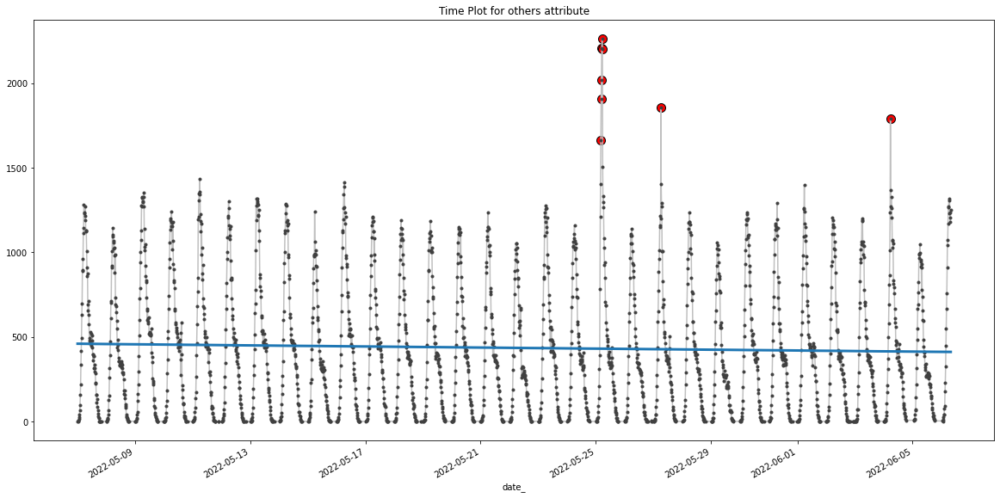

In [84]:
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
    figsize=(20,10)
)
ax = y.plot(**plot_params)
ax = y_pred.plot(ax=ax, linewidth=3)
# ax = outlier_points.plot(ax=ax, )

outlier_y_others = list(outlier_points_others.values)
outlier_x_others = list(outlier_points_others.index)

plt.scatter(outlier_x_others, outlier_y_others, marker='o',c='red', edgecolors='black', s=100)
ax.set_title('Time Plot for others attribute')



# 2. For 'google_pay' attribute of our Dataset

## Plotting box-plot for visualizing the anomalies for our google_pay attribute

D:\College Softwares\Anaconda\envs\fsds_ml\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='google_pay'>

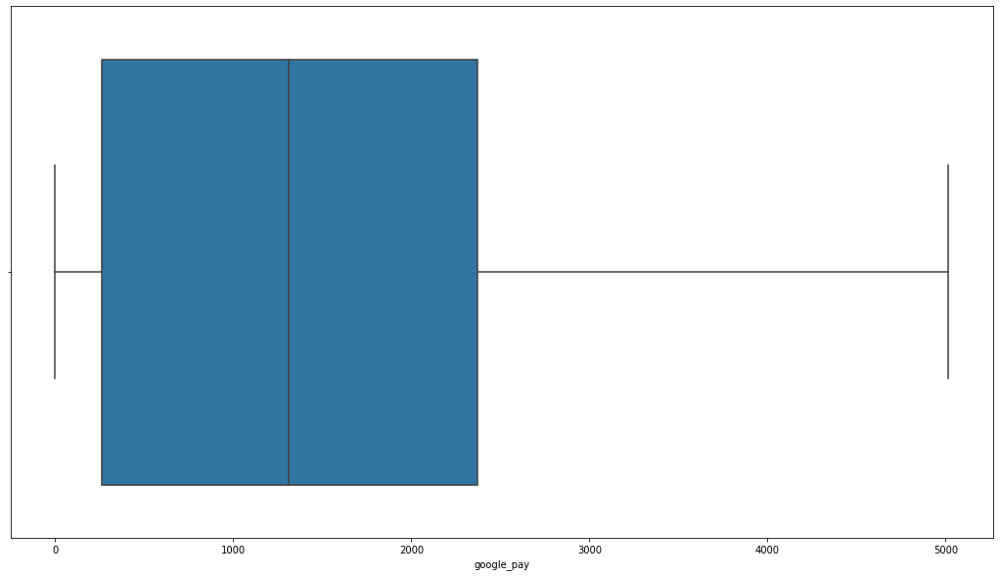

In [85]:
sns.boxplot(df1.google_pay, orient='h')

In [86]:
import plotly.express as px
fig = px.box(df1.google_pay, height=750)
fig.show()

In [87]:
x_train_google_pay = train_df.loc[:,['Time']]
y_train_google_pay = train_df.loc[:,'google_pay']

x_test_google_pay = test_df.loc[:,['Time']]
y_test_google_pay = test_df.loc[:,'google_pay']

In [88]:
x_train_google_pay

,Time
date_,
2022-05-07 00:15:00,0
2022-05-07 00:30:00,1
2022-05-07 00:45:00,2
2022-05-07 01:00:00,3
2022-05-07 01:15:00,4
...,...
2022-05-31 04:30:00,1831
2022-05-31 04:45:00,1832
2022-05-31 05:00:00,1833


In [89]:
y_train_google_pay

date_
2022-05-07 00:15:00       0.0
2022-05-07 00:30:00       0.0
2022-05-07 00:45:00       9.0
2022-05-07 01:00:00      23.0
2022-05-07 01:15:00      30.0
                        ...  
2022-05-31 04:30:00    3042.0
2022-05-31 04:45:00    3330.0
2022-05-31 05:00:00    3912.0
2022-05-31 05:15:00    4118.0
2022-05-31 05:30:00    4308.0
Name: google_pay, Length: 1836, dtype: float64

In [90]:
x_test_google_pay

,Time
date_,
2022-05-31 06:00:00,1837
2022-05-31 06:15:00,1838
2022-05-31 06:30:00,1839
2022-05-31 06:45:00,1840
2022-05-31 07:00:00,1841
...,...
2022-06-06 06:45:00,2290
2022-06-06 07:00:00,2291
2022-06-06 07:15:00,2292


In [91]:
y_test_google_pay

date_
2022-05-31 06:00:00    4296.0
2022-05-31 06:15:00    4300.0
2022-05-31 06:30:00    4206.0
2022-05-31 06:45:00    4050.0
2022-05-31 07:00:00    3812.0
                        ...  
2022-06-06 06:45:00    4717.0
2022-06-06 07:00:00    4553.0
2022-06-06 07:15:00    4463.0
2022-06-06 07:30:00    4562.0
2022-06-06 07:45:00    4287.0
Name: google_pay, Length: 458, dtype: float64

In [92]:
y_train_google_pay,x_train_google_pay = y_train_google_pay.align(x_train_google_pay, join='inner')

In [93]:
from sklearn.linear_model import LinearRegression

lr_google_pay = LinearRegression()

lr_google_pay.fit(x_train_google_pay,y_train_google_pay)

LinearRegression()

In [94]:
y_pred_google_pay = pd.Series(lr_google_pay.predict(x_test_google_pay), index=x_test_google_pay.index)
y_pred_google_pay

date_
2022-05-31 06:00:00    1384.100335
2022-05-31 06:15:00    1383.930525
2022-05-31 06:30:00    1383.760715
2022-05-31 06:45:00    1383.590905
2022-05-31 07:00:00    1383.421095
                          ...     
2022-06-06 06:45:00    1307.176351
2022-06-06 07:00:00    1307.006541
2022-06-06 07:15:00    1306.836731
2022-06-06 07:30:00    1306.666920
2022-06-06 07:45:00    1306.497110
Length: 458, dtype: float64

In [95]:
outlier_points_google_pay = get_outlier_points(df1.google_pay)

The following are the outliers in the boxplot:Series([], Name: google_pay, dtype: float64)


In [96]:
## Generic
x = df1.loc[:,['Time']]
y = df1.loc[:,'google_pay']

from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(x,y)

y_pred = pd.Series(lr.predict(x), index=x.index)

Text(0.5, 1.0, 'Time Plot of google_pay attribute')

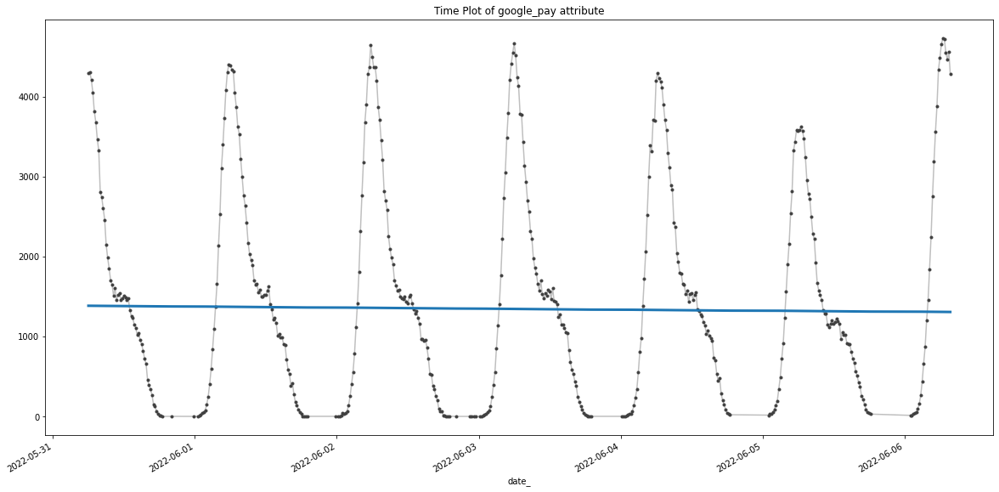

In [97]:

plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
    figsize=(20,10)
)
ax = y_test_google_pay.plot(**plot_params)
ax = y_pred_google_pay.plot(ax=ax, linewidth=3)
# ax = outlier_points.plot(ax=ax, )

outlier_y_google_pay = list(outlier_points_google_pay.values)
outlier_x_google_pay = list(outlier_points_google_pay.index)

plt.scatter(outlier_x_google_pay, outlier_y_google_pay, marker='o',c='red', edgecolors='black', s=100)
ax.set_title('Time Plot of google_pay attribute')



# 3. For 'phonepe' attribute of our Dataset

## Plotting box-plot for visualizing the anomalies in our dataset for our phonepe attribute

D:\College Softwares\Anaconda\envs\fsds_ml\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='phonepe'>

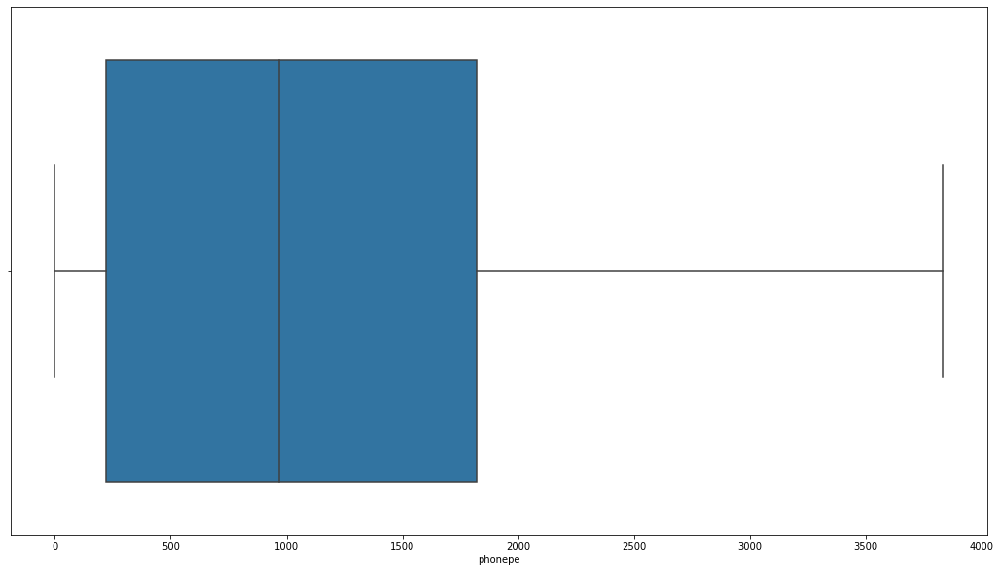

In [98]:
sns.boxplot(df1.phonepe, orient='h')

In [99]:
import plotly.express as px
fig = px.box(df1.phonepe, height=750)
fig.show()

In [100]:
x_train_phonepe = train_df.loc[:,['Time']]
y_train_phonepe = train_df.loc[:,'phonepe']

x_test_phonepe = test_df.loc[:,['Time']]
y_test_phonepe = test_df.loc[:,'phonepe']

In [101]:
x_train_phonepe

,Time
date_,
2022-05-07 00:15:00,0
2022-05-07 00:30:00,1
2022-05-07 00:45:00,2
2022-05-07 01:00:00,3
2022-05-07 01:15:00,4
...,...
2022-05-31 04:30:00,1831
2022-05-31 04:45:00,1832
2022-05-31 05:00:00,1833


In [102]:
y_train_phonepe

date_
2022-05-07 00:15:00       0.0
2022-05-07 00:30:00       5.0
2022-05-07 00:45:00       4.0
2022-05-07 01:00:00      26.0
2022-05-07 01:15:00      56.0
                        ...  
2022-05-31 04:30:00    2617.0
2022-05-31 04:45:00    2765.0
2022-05-31 05:00:00    3042.0
2022-05-31 05:15:00    3322.0
2022-05-31 05:30:00    3328.0
Name: phonepe, Length: 1836, dtype: float64

In [103]:
x_test_phonepe

,Time
date_,
2022-05-31 06:00:00,1837
2022-05-31 06:15:00,1838
2022-05-31 06:30:00,1839
2022-05-31 06:45:00,1840
2022-05-31 07:00:00,1841
...,...
2022-06-06 06:45:00,2290
2022-06-06 07:00:00,2291
2022-06-06 07:15:00,2292


In [104]:
y_test_phonepe

date_
2022-05-31 06:00:00    3317.0
2022-05-31 06:15:00    3195.0
2022-05-31 06:30:00    3047.0
2022-05-31 06:45:00    2960.0
2022-05-31 07:00:00    2672.0
                        ...  
2022-06-06 06:45:00    3471.0
2022-06-06 07:00:00    3289.0
2022-06-06 07:15:00    3171.0
2022-06-06 07:30:00    3143.0
2022-06-06 07:45:00    2856.0
Name: phonepe, Length: 458, dtype: float64

In [105]:
y_train_phonepe,x_train_phonepe = y_train_phonepe.align(x_train_phonepe, join='inner')

In [106]:
from sklearn.linear_model import LinearRegression

lr_phonepe = LinearRegression()

lr_phonepe.fit(x_train_phonepe,y_train_phonepe)

LinearRegression()

In [107]:
y_pred_phonepe = pd.Series(lr_phonepe.predict(x_test_phonepe), index=x_test_phonepe.index)
y_pred_phonepe

date_
2022-05-31 06:00:00    1075.663502
2022-05-31 06:15:00    1075.573899
2022-05-31 06:30:00    1075.484297
2022-05-31 06:45:00    1075.394695
2022-05-31 07:00:00    1075.305092
                          ...     
2022-06-06 06:45:00    1035.073652
2022-06-06 07:00:00    1034.984049
2022-06-06 07:15:00    1034.894447
2022-06-06 07:30:00    1034.804845
2022-06-06 07:45:00    1034.715243
Length: 458, dtype: float64

In [108]:
outlier_points_phonepe = get_outlier_points(df1.phonepe)

The following are the outliers in the boxplot:Series([], Name: phonepe, dtype: float64)


In [109]:
## Generic
x = df1.loc[:,['Time']]
y = df1.loc[:,'google_pay']

from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(x,y)

y_pred = pd.Series(lr.predict(x), index=x.index)

Text(0.5, 1.0, 'Time Plot of phonepe attribute')

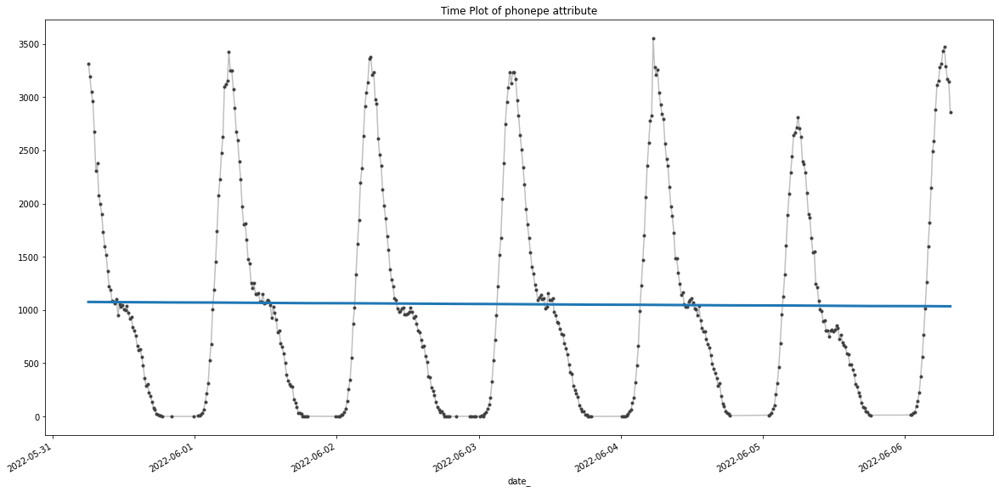

In [110]:

plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
    figsize=(20,10)
)
ax = y_test_phonepe.plot(**plot_params)
ax = y_pred_phonepe.plot(ax=ax, linewidth=3)
# ax = outlier_points.plot(ax=ax, )

outlier_y_phonepe = list(outlier_points_phonepe.values)
outlier_x_phonepe = list(outlier_points_phonepe.index)

plt.scatter(outlier_x_phonepe, outlier_y_phonepe, marker='o',c='red', edgecolors='black', s=100)
ax.set_title('Time Plot of phonepe attribute')



# 4. For 'paytm' attribute of our Dataset

## Plotting box-plot for visualizing the anomalies in our dataset for paytm attribute

D:\College Softwares\Anaconda\envs\fsds_ml\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='paytm'>

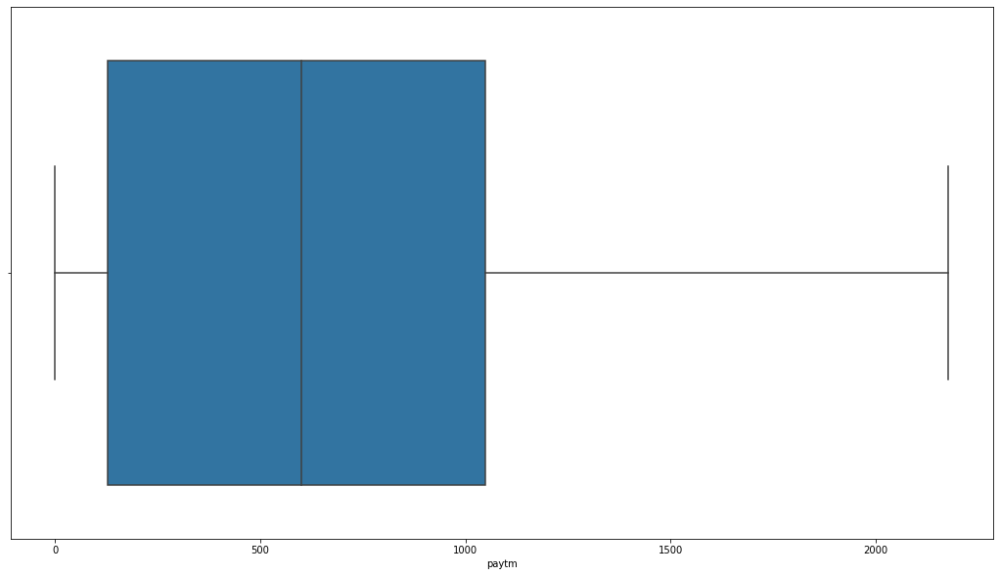

In [111]:
sns.boxplot(df1.paytm, orient='h')

In [112]:
import plotly.express as px
fig = px.box(df1.paytm, height=750)
fig.show()

In [113]:
x_train_paytm = train_df.loc[:,['Time']]
y_train_paytm = train_df.loc[:,'paytm']

x_test_paytm = test_df.loc[:,['Time']]
y_test_paytm = test_df.loc[:,'paytm']

In [114]:
x_train_paytm

,Time
date_,
2022-05-07 00:15:00,0
2022-05-07 00:30:00,1
2022-05-07 00:45:00,2
2022-05-07 01:00:00,3
2022-05-07 01:15:00,4
...,...
2022-05-31 04:30:00,1831
2022-05-31 04:45:00,1832
2022-05-31 05:00:00,1833


In [115]:
y_train_paytm

date_
2022-05-07 00:15:00       3.0
2022-05-07 00:30:00       2.0
2022-05-07 00:45:00       3.0
2022-05-07 01:00:00      13.0
2022-05-07 01:15:00      15.0
                        ...  
2022-05-31 04:30:00    1373.0
2022-05-31 04:45:00    1542.0
2022-05-31 05:00:00    1719.0
2022-05-31 05:15:00    1841.0
2022-05-31 05:30:00    1901.0
Name: paytm, Length: 1836, dtype: float64

In [116]:
x_test_paytm

,Time
date_,
2022-05-31 06:00:00,1837
2022-05-31 06:15:00,1838
2022-05-31 06:30:00,1839
2022-05-31 06:45:00,1840
2022-05-31 07:00:00,1841
...,...
2022-06-06 06:45:00,2290
2022-06-06 07:00:00,2291
2022-06-06 07:15:00,2292


In [117]:
y_test_paytm

date_
2022-05-31 06:00:00    1870.0
2022-05-31 06:15:00    1897.0
2022-05-31 06:30:00    1793.0
2022-05-31 06:45:00    1732.0
2022-05-31 07:00:00    1473.0
                        ...  
2022-06-06 06:45:00    1864.0
2022-06-06 07:00:00    1860.0
2022-06-06 07:15:00    1745.0
2022-06-06 07:30:00    1733.0
2022-06-06 07:45:00    1679.0
Name: paytm, Length: 458, dtype: float64

In [118]:
y_train_paytm,x_train_paytm = y_train_paytm.align(x_train_paytm, join='inner')

In [119]:
from sklearn.linear_model import LinearRegression

lr_paytm = LinearRegression()

lr_paytm.fit(x_train_paytm,y_train_paytm)

LinearRegression()

In [120]:
y_pred_paytm = pd.Series(lr_paytm.predict(x_test_paytm), index=x_test_paytm.index)
y_pred_paytm

date_
2022-05-31 06:00:00    636.555849
2022-05-31 06:15:00    636.497425
2022-05-31 06:30:00    636.439001
2022-05-31 06:45:00    636.380577
2022-05-31 07:00:00    636.322153
                          ...    
2022-06-06 06:45:00    610.089791
2022-06-06 07:00:00    610.031367
2022-06-06 07:15:00    609.972943
2022-06-06 07:30:00    609.914519
2022-06-06 07:45:00    609.856095
Length: 458, dtype: float64

In [121]:
outlier_points_paytm = get_outlier_points(df1.paytm)

The following are the outliers in the boxplot:Series([], Name: paytm, dtype: float64)


In [122]:
## Generic
x = df1.loc[:,['Time']]
y = df1.loc[:,'google_pay']

from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(x,y)

y_pred = pd.Series(lr.predict(x), index=x.index)

Text(0.5, 1.0, 'Time Plot of paytm attribute')

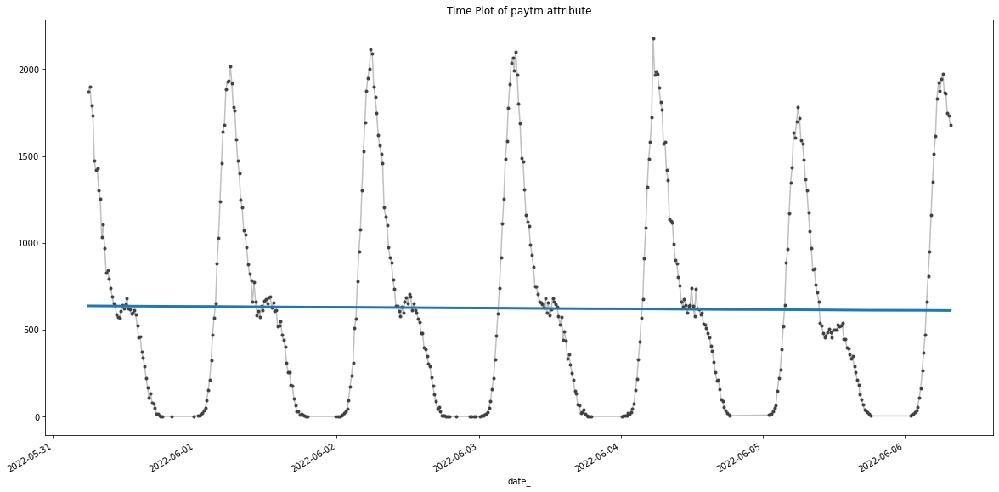

In [123]:

plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
    figsize=(20,10)
)
ax = y_test_paytm.plot(**plot_params)
ax = y_pred_paytm.plot(ax=ax, linewidth=3)
# ax = outlier_points.plot(ax=ax, )

outlier_y_paytm = list(outlier_points_paytm.values)
outlier_x_paytm = list(outlier_points_paytm.index)

plt.scatter(outlier_x_paytm, outlier_y_paytm, marker='o',c='red', edgecolors='black', s=100)
ax.set_title('Time Plot of paytm attribute')



# Attempt for ARIMA model

# Implementation of ARIMA model

- Now in order to implement our ARIMA model we need to find the values of:

> <b>1. Auto Regression (p) value:</b>
    > This p value can be determined from ACF(Auto Correlation Funtion) Graph.
    
> <b>2. Integrated or Differencing (d) value</b> 
    > As our Dataset is stationary, which can be proved through the graph and the Dickey Fuller Test Statistics so no need of differencing it. Therefore, d value = 0.
    
> <b>3. Moving Average (q) value</b>
    >This q value can be determined from PACF(Partial Auto Correlation Function) Graph.

## Plotting PACF and ACF graph for our dataset:
- As we know that in our Dataset, each attribute individually plays a vital role and showcases direct correlation with the defined timestamps.
- So, we can plot the ACF and PACF graphs for individual attribute for better understanding.

## 1. Plotting the graphs for google_pay data

Figure(1296x720)
Figure(1296x720)


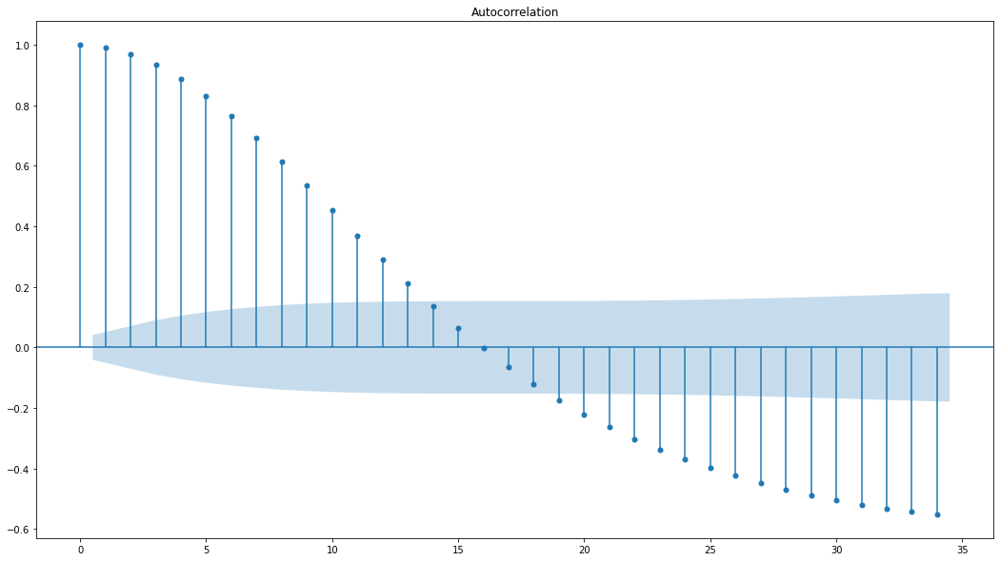

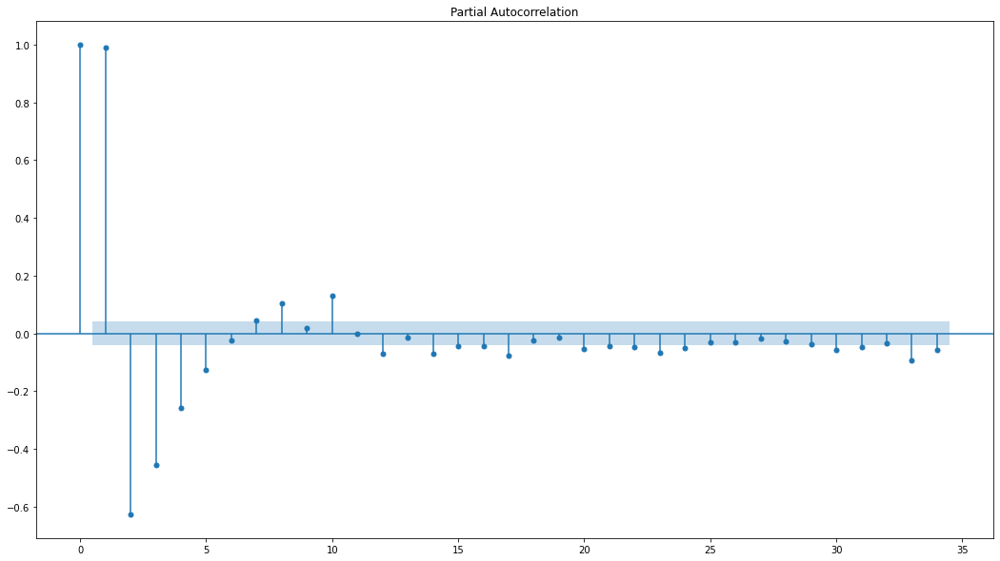

In [124]:
print(plot_acf(df1.google_pay))  # exponential decay
print(plot_pacf(df1.google_pay)) # number of significant lags

### Conclusion from the above plots for 'google_pay' attribute:
> - As we can see that in the ACF graph for every corresponding and continuous lag there is an exponential reduction in the correlation values so we can go ahead for AR model. 
> - Now we can check the PACF graph for furthur analysis and choosing the order for our model.
> - In the PACF graph, as the number of lag scale starts from 0 so this means that the first value is the value of correlation of the lag itself so we can ignore it.
> - Finally analyzing the graph from lag 1, we can acquire 

## 2. Plotting the graphs for paytm data


Figure(1296x720)
Figure(1296x720)


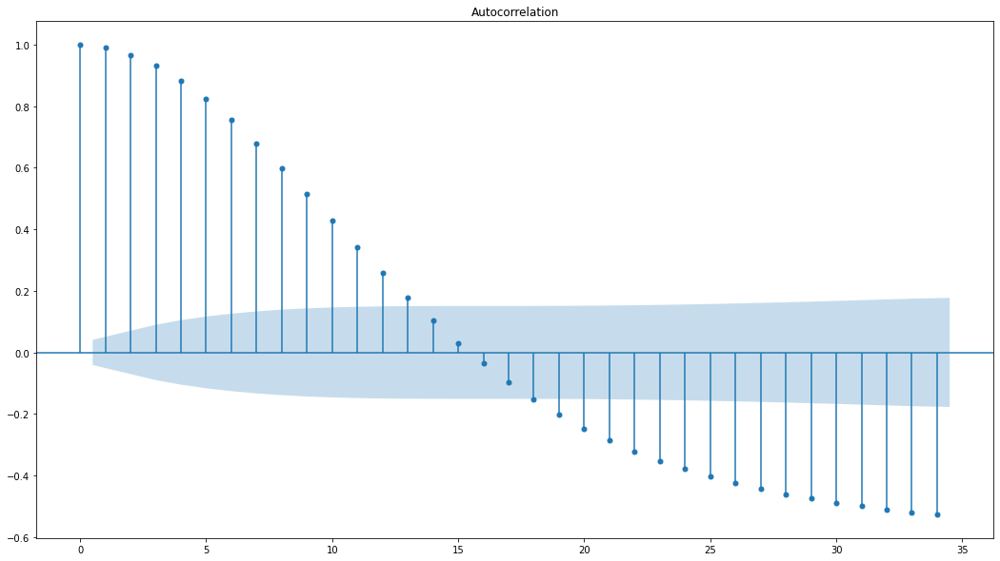

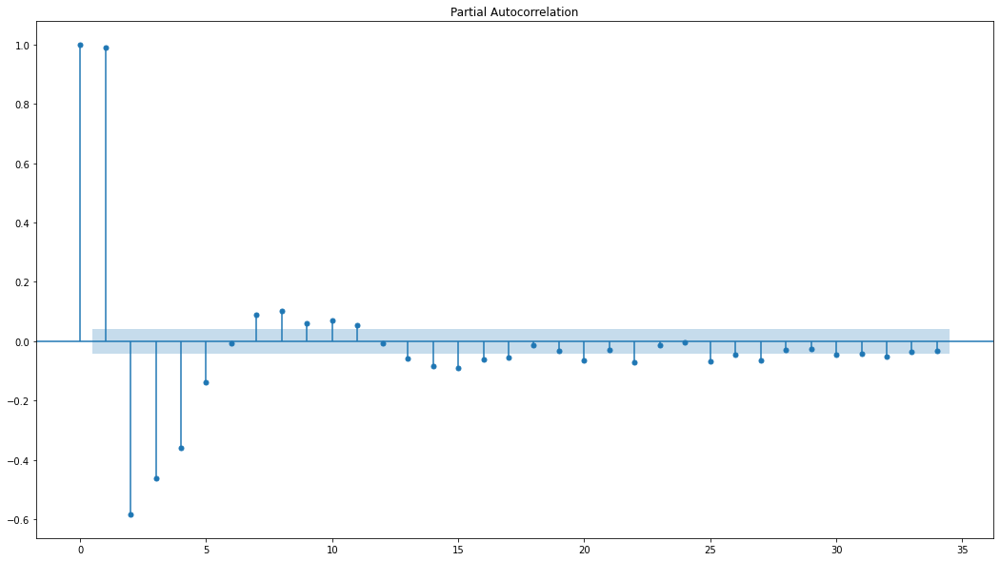

In [125]:
print(plot_acf(df1.paytm))
print(plot_pacf(df1.paytm))

## 3. Plotting the graphs for phone_pe data

Figure(1296x720)
Figure(1296x720)


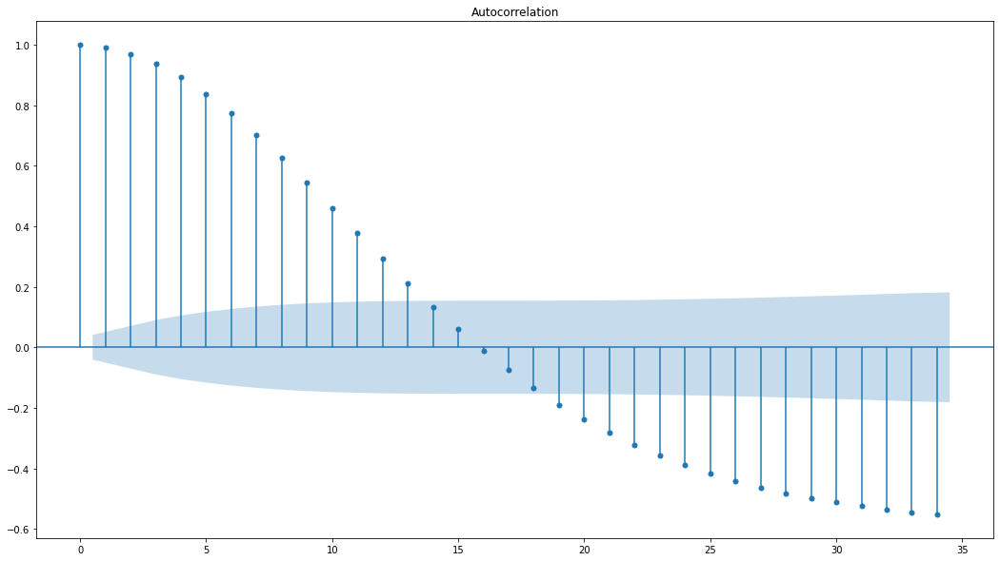

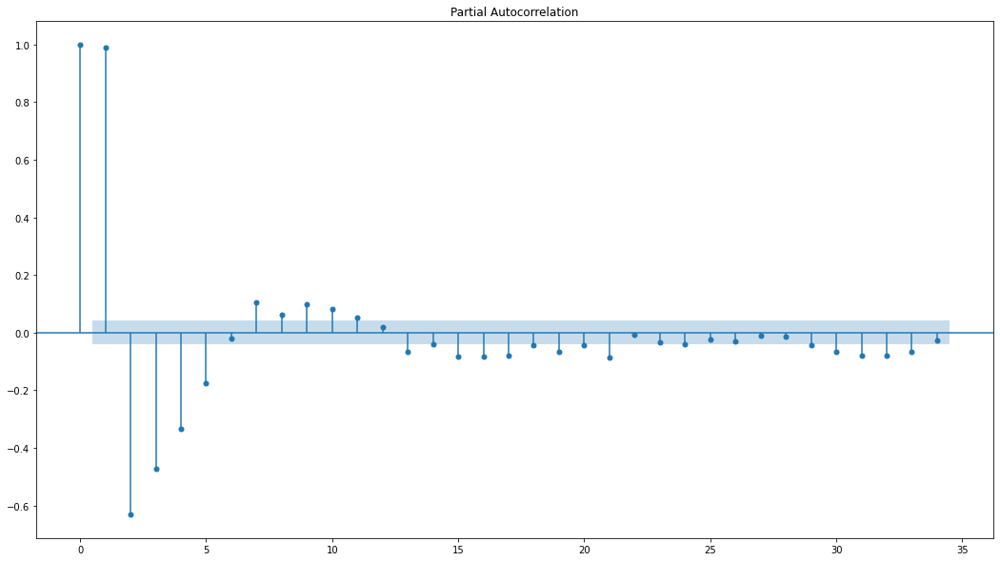

In [126]:
print(plot_acf(df1.phonepe))
print(plot_pacf(df1.phonepe))

## 4. Plotting the graphs for others attribute data

Figure(1296x720)
Figure(1296x720)


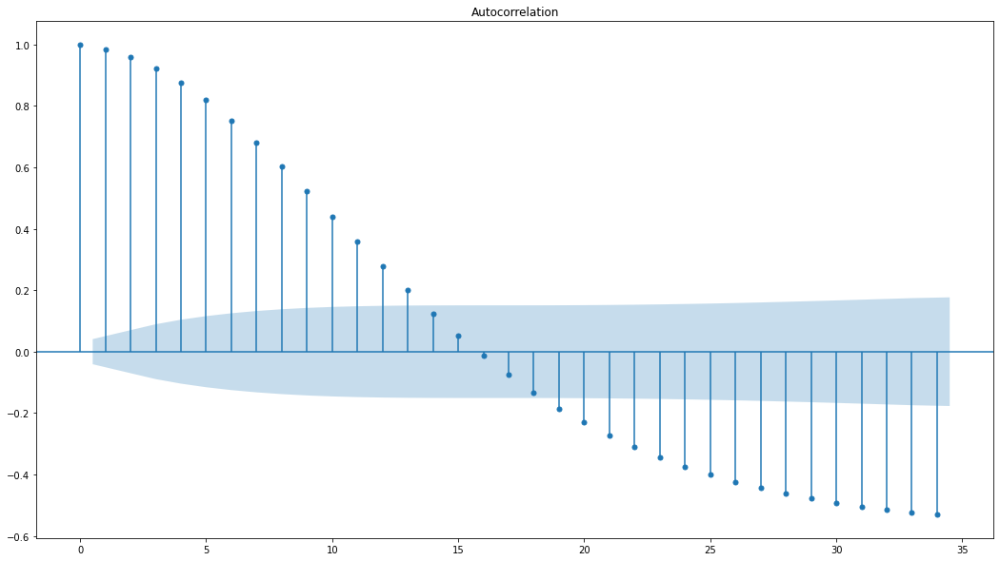

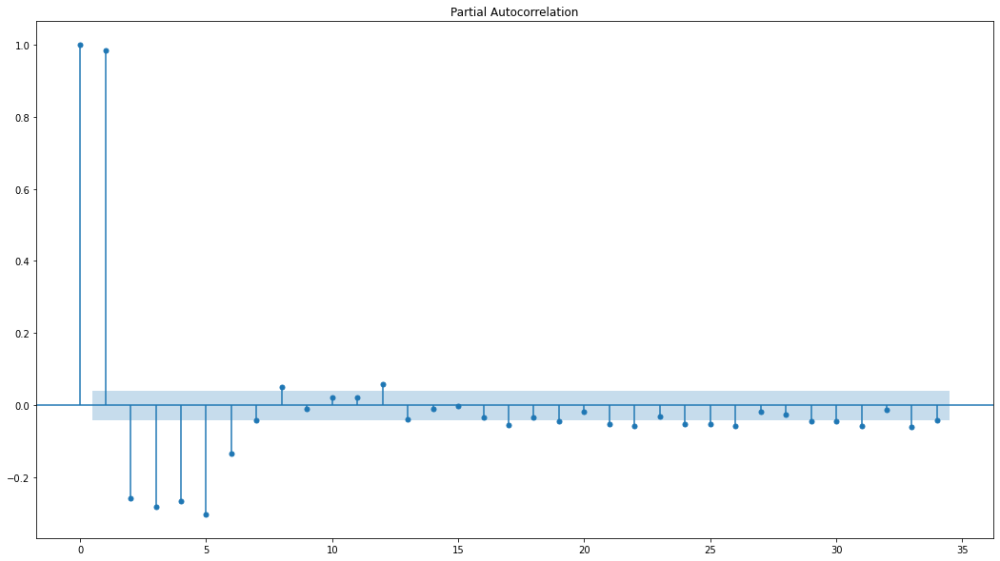

In [127]:
print(plot_acf(df1.others))
print(plot_pacf(df1.others))

# Building our ARIMA(AR) model 

## Configuration for our ARIMA model:
- Initially, we are going to build our ARIMA model for the 'others' attribute
-  As we have already analyzed our ACF and PACF graphs and calculated the p, d, q values so we are ready to build the model.
- <b>NOTE: This build is just an attempt to analyze the working of ARIMA model(or we can say AR model) with our dataset</b>

In [128]:
model_ARIMA=ARIMA(df1.others,order=(8,0,0))
model_fit_others = model_ARIMA.fit(disp=0)

D:\College Softwares\Anaconda\envs\fsds_ml\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning:


statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)


D:\College Softwares\Anaconda\envs\fsds_ml\lib\site-packages\statsmodels\tsa\base\tsa_model.py:583: ValueWarning:

A date index has been provided, but it has no associated frequency information and

In [129]:
print(model_fit_others.summary())

                              ARMA Model Results                              
Dep. Variable:                 others   No. Observations:                 2295
Model:                     ARMA(8, 0)   Log Likelihood              -12575.911
Method:                       css-mle   S.D. of innovations             57.957
Date:                Sun, 10 Jul 2022   AIC                          25171.822
Time:                        20:48:35   BIC                          25229.207
Sample:                             0   HQIC                         25192.746
                                                                              
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const          435.4993     25.500     17.079      0.000     385.521     485.478
ar.L1.others     0.9700      0.021     46.530      0.000       0.929       1.011
ar.L2.others     0.1307      0.029      4.50

In [130]:
residual_others = model_fit_others.resid

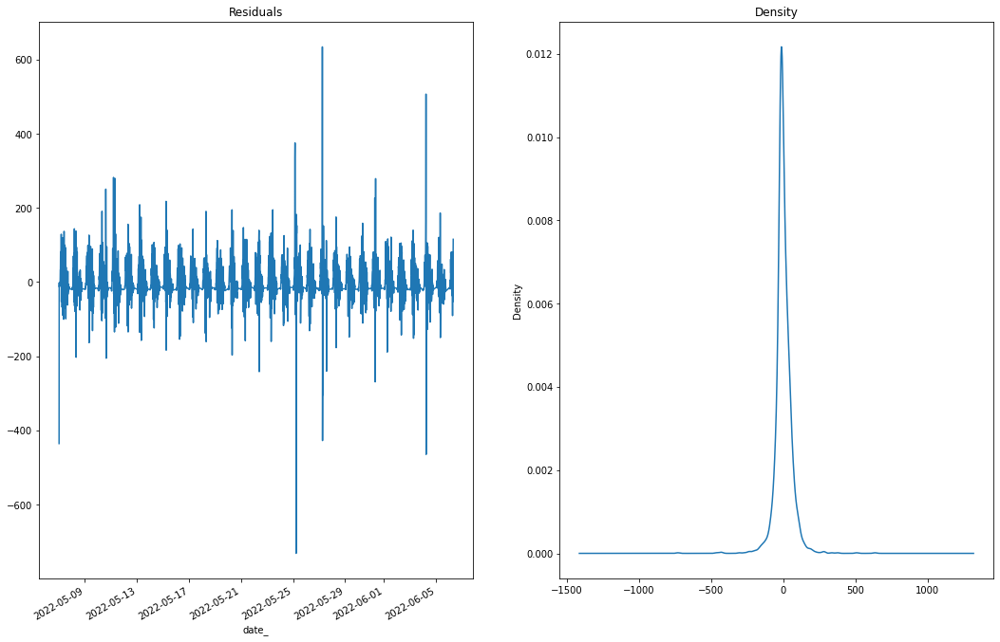

In [131]:
fig, ax = plt.subplots(1,2)
fig.set_figheight(12)
fig.set_figwidth(18)
residual_others.plot(title="Residuals", ax=ax[0])
residual_others.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

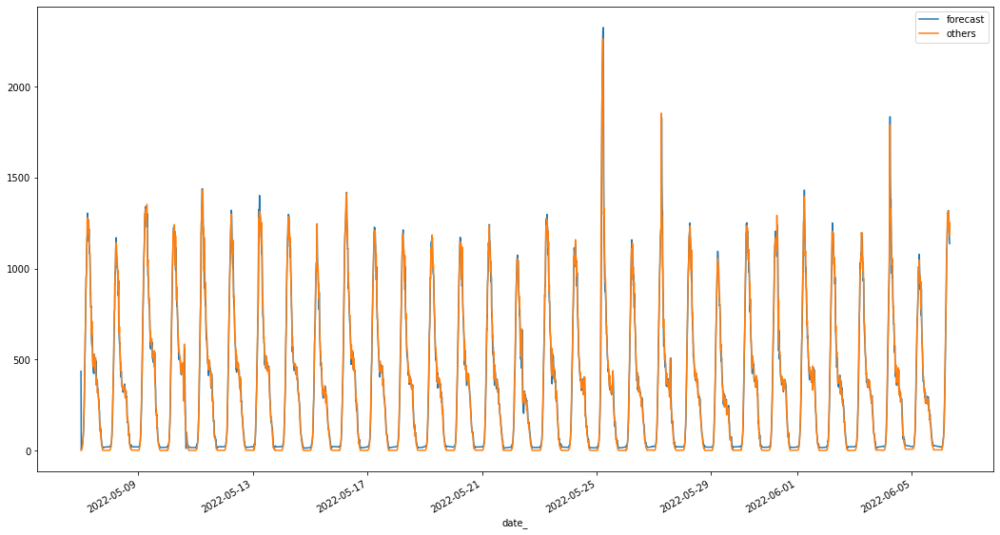

In [132]:
model_fit_others.plot_predict(dynamic=False)
plt.show()

In [133]:
_others_train_df = df1[df1.Time < train_end_index].others
_others_train_df

date_
2022-05-07 00:15:00       0.0
2022-05-07 00:30:00       5.0
2022-05-07 00:45:00       2.0
2022-05-07 01:00:00       5.0
2022-05-07 01:15:00      13.0
                        ...  
2022-05-31 04:30:00     883.0
2022-05-31 04:45:00     984.0
2022-05-31 05:00:00    1079.0
2022-05-31 05:15:00    1080.0
2022-05-31 05:30:00    1168.0
Name: others, Length: 1836, dtype: float64

In [134]:
_others_test_df = df1[df1.Time > train_end_index].others
_others_test_df

date_
2022-05-31 06:00:00    1161.0
2022-05-31 06:15:00    1136.0
2022-05-31 06:30:00    1148.0
2022-05-31 06:45:00    1097.0
2022-05-31 07:00:00    1293.0
                        ...  
2022-06-06 06:45:00    1316.0
2022-06-06 07:00:00    1237.0
2022-06-06 07:15:00    1206.0
2022-06-06 07:30:00    1179.0
2022-06-06 07:45:00    1252.0
Name: others, Length: 458, dtype: float64

In [135]:
model_ARIMA_testing_others=ARIMA(_others_train_df,order=(8,0,0))
model_fit_testing_others = model_ARIMA_testing_others.fit()

D:\College Softwares\Anaconda\envs\fsds_ml\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning:


statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)


D:\College Softwares\Anaconda\envs\fsds_ml\lib\site-packages\statsmodels\tsa\base\tsa_model.py:583: ValueWarning:

A date index has been provided, but it has no associated frequency information and

In [136]:
print(model_fit_testing_others.summary())

                              ARMA Model Results                              
Dep. Variable:                 others   No. Observations:                 1836
Model:                     ARMA(8, 0)   Log Likelihood              -10037.366
Method:                       css-mle   S.D. of innovations             57.208
Date:                Sun, 10 Jul 2022   AIC                          20094.732
Time:                        20:48:41   BIC                          20149.885
Sample:                             0   HQIC                         20115.071
                                                                              
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const          437.9352     29.242     14.976      0.000     380.622     495.249
ar.L1.others     0.9804      0.023     42.151      0.000       0.935       1.026
ar.L2.others     0.1183      0.033      3.63

In [137]:
start=_others_train_df.index[0]
end=_others_test_df.index[-1]
model_fit_testing_others.predict(start=start,end=end )
print(start)
print(end)

KeyError: 'The `end` argument could not be matched to a location related to the index of the data.'

In [ ]:
_others_train_df.index[0]

In [ ]:
text = pd.DataFrame(model_ARIMA.predict(df1.others))

In [ ]:
text

In [ ]:
text.describe()

In [ ]:
text.info()

In [ ]:
text.isna().sum()

In [ ]:
# training data

# testing data
df1.others.loc['2022-05-07 00:00:00':'2022-05-08 00:00:00'].plot()


In [ ]:
df1.others

In [ ]:
string = "07 May 2015  00:15:00"
date = datetime.strptime(string, "%d %b %Y  %H:%M:%S")

print(date)

In [ ]:
type(date.year)

# TEST

In [ ]:
# Thinking to add a threshold
# clean_data = removed outlier



# df1.others[df1.others!=outlier_y].describe()
# # df1.others

# OLS -> Linear
# Facebook algo for forecasting


model_ARIMA.predict
for i in df1.others:
    print(i)

In [ ]:
"""
# grid search ARIMA parameters for time series
import warnings
from math import sqrt
from pandas import read_csv
from pandas import datetime
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error

# evaluate an ARIMA model for a given order (p,d,q)
def evaluate_arima_model(X, arima_order):
	# prepare training dataset
	train_size = int(len(X) * 0.66)
	train, test = X[0:train_size], X[train_size:]
	history = [x for x in train]
	# make predictions
	predictions = list()
	for t in range(len(test)):
		model = ARIMA(history, order=arima_order)
		model_fit = model.fit()
		yhat = model_fit.forecast()[0]
		predictions.append(yhat)
		history.append(test[t])
	# calculate out of sample error
	rmse = sqrt(mean_squared_error(test, predictions))
	return rmse

# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
	dataset = dataset.astype('float32')
	best_score, best_cfg = float("inf"), None
	for p in p_values:
		for d in d_values:
			for q in q_values:
				order = (p,d,q)
				try:
					rmse = evaluate_arima_model(dataset, order)
					if rmse < best_score:
						best_score, best_cfg = rmse, order
					print('ARIMA%s RMSE=%.3f' % (order,rmse))
				except:
					continue
	print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))

# load dataset
def parser(x):
	return datetime.strptime('190'+x, '%Y-%m')
# evaluate parameters
p_values = [1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
evaluate_models(df1.google_pay, p_values, d_values, q_values)
"""

In [ ]:
df1.loc['2022-05-07 00:00:00':'2022-05-08 00:00:00']

In [ ]:
df1.loc['2022-05-07 00:00:00':'2022-05-08 00:00:00'].plot()

In [ ]:
df2 = df1.copy(deep=True)
df2['google_pay']=df2['google_pay']-df2['google_pay'].shift(72)

In [ ]:
df2.plot()

In [ ]:
plot_acf(df2.google_pay.dropna())
plot_pacf(df2.google_pay.dropna())

In [ ]:
df